In [1]:
import numpy as np
import pandas as pd
import scipy as sp
#from scipy.interpolate import RBFInterpolator


import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import QuantileTransformer
#from sklearn.metrics import pairwise_distances
import gstatsim as gs
import gstools as gstools
#from mpl_toolkits.axes_grid1 import make_axes_locatable
import skgstat as skg
from skgstat import models
#from matplotlib.colors import LightSource

import random
import time
import math
import os

from PIL import Image, ImageFilter

In [2]:
import geomc

In [3]:
# %load_ext autoreload
# %autoreload 2

## Preprocessing

In [4]:
xmin_set = 2300000
xmax_set = 2600000
ymin_set = -500000
ymax_set = -300000

resolution = 1000

In [5]:
df = pd.read_csv('Data/compiled_Aurora_noQC_iceshelve_included_3.csv')

velx = np.loadtxt('Data/velx_MEaSUREs_linear.txt')
df['vel_x'] = velx.flatten()
vely = np.loadtxt('Data/vely_MEaSUREs_linear.txt')
df['vel_y'] = vely.flatten()

df = df[(df['X']>xmin_set) & (df['X']<=xmax_set) & (df['Y']>ymin_set) & (df['Y']<=ymax_set)].copy()

x_uniq = np.unique(df.X)
y_uniq = np.unique(df.Y)
cols = len(x_uniq)
rows = len(y_uniq)
xx, yy = np.meshgrid(x_uniq, y_uniq)

print(xx.shape, np.min(xx),np.max(xx),np.min(yy),np.max(yy))

(200, 300) 2301000.0 2600000.0 -499000.0 -300000.0


In [6]:
floating_mask = df.bedmachine_mask.values.reshape(xx.shape)
floating_mask = (floating_mask == 0) | (floating_mask == 3)
mask_final = geomc.find_mask(df.vel_x.values.reshape(xx.shape),df.vel_y.values.reshape(xx.shape),50,
                             df.bedmachine_mask.values.reshape(xx.shape)==2,floating_mask,5000,
                             xx,yy)

1.32549273167603 1.3202704 0.18121015647151228 0.20660445


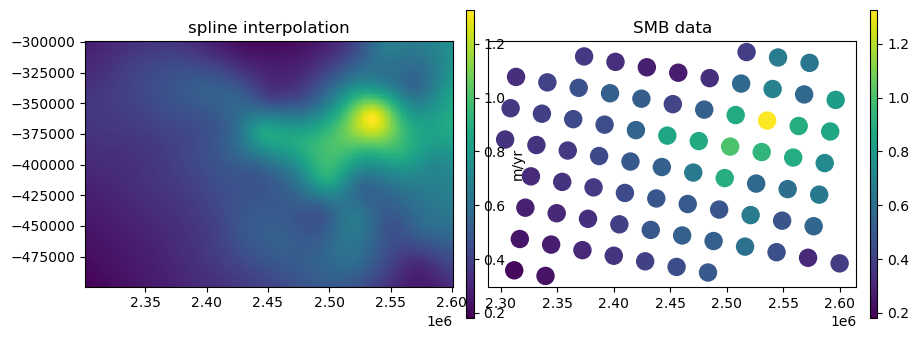

In [7]:
smb, fig = geomc.load_smb('./Data/SMB_RACMO2.3p2_yearly_ANT27_1979_2016.nc',xx,yy,interp_method='spline')

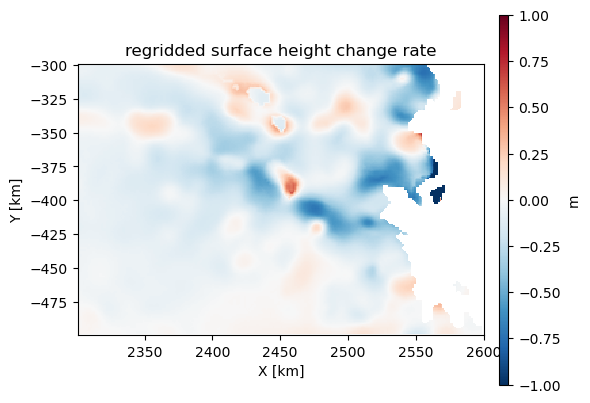

In [8]:
dhdt, fig = geomc.load_dhdt('./Data/ANT_G1920_GroundedIceHeight_v01.nc',xx,yy,interp_method='linear')

In [9]:
surf = df.surface.values.reshape((rows,cols))
velx = np.loadtxt('Data/velx_MEaSUREs_linear_denman.txt')
vely = np.loadtxt('Data/vely_MEaSUREs_linear_denman.txt')

In [10]:
df_bm = pd.read_csv('./Data/AIS_bedmachine_1000m.csv')
df_bm = df_bm[(df_bm['x']>xmin_set) & (df_bm['x']<=xmax_set) & (df_bm['y']>ymin_set) & (df_bm['y']<=ymax_set)].copy()
df_bm = df_bm.reset_index()

In [11]:
mc_res_bm = geomc.calc_mass_conservation(df_bm.bed.values.reshape(rows,cols), surf, velx, vely, dhdt, smb)
geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)

3669701.4794974984

(2300500.0, 2600500.0, -499500.0, -299500.0)

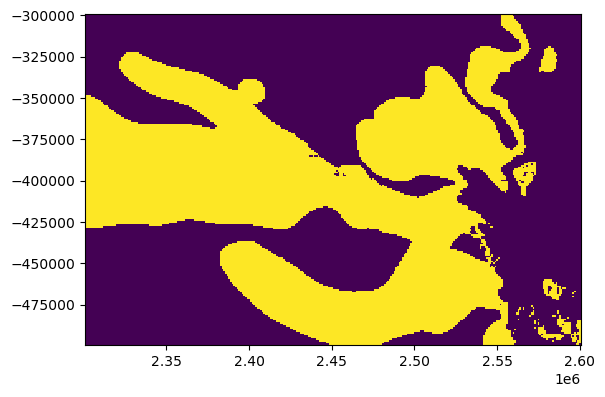

In [12]:
plt.pcolormesh(xx,yy,mask_final)
plt.axis('scaled')

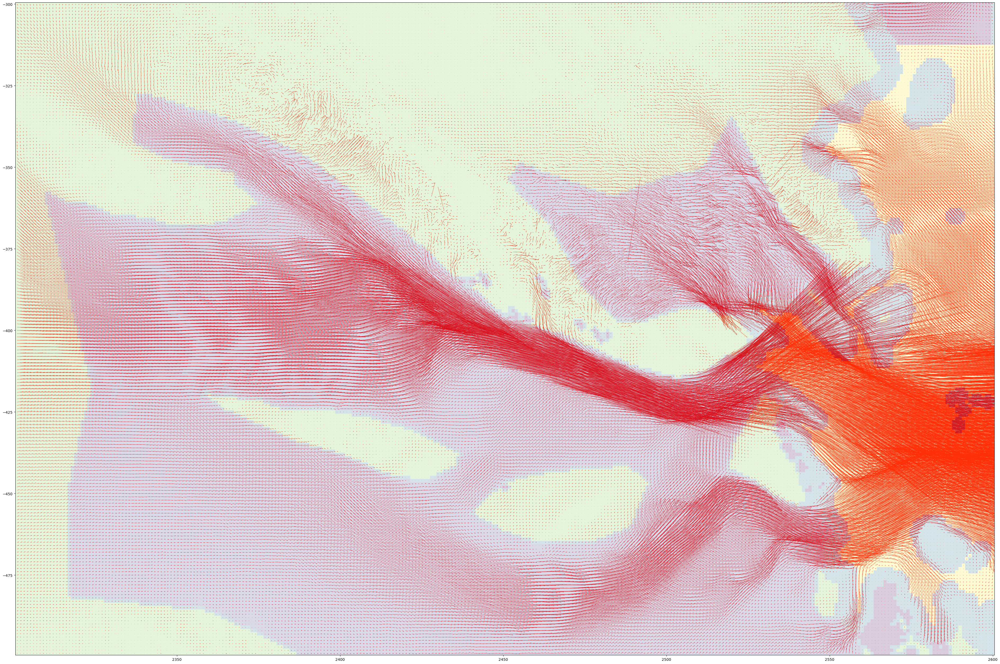

In [174]:
fig = plt.figure(figsize=(48,32))
plt.quiver(xx/1000, yy/1000, velx, vely, scale_units="x",
           scale=30, width=0.0002, color='red')
plt.pcolormesh(xx/1000, yy/1000,  df_bm.source.values.reshape((rows,cols)), cmap='viridis',alpha=0.2)
plt.axis('scaled')
plt.savefig('totten_vel_vector.png')

range, sill, and nugget for gaussian variogram is  [36708.26619848554, 1.3213354674965283, 0]
for exponential variogram is  [59110.246556862076, 1.4374403774371012, 0]
for spherical variogram is  [40686.10673128956, 1.3422687931623634, 0]


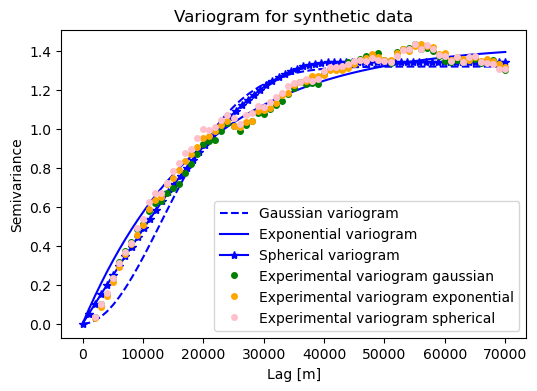

In [12]:
df_bed = df.copy()
df_bed = df_bed[df_bed["bed"].isnull() == False]
data = df_bed['bed'].values.reshape(-1,1)
coords = df_bed[['X','Y']].values
roughness_region_mask = (df_bed['bedmachine_mask'].values)==2

nst_trans, Nbed_radar, varios, fig = geomc.fit_variogram(data, coords, roughness_region_mask, maxlag=70000, n_lags=70)

In [22]:
# vario1_radar = [azimuth, nugget, major_range, minor_range, sill, vtype]
tp3 = varios[2]
vario1_radar = [0, 0, tp3[0], tp3[0], tp3[1], 'Spherical']

In [23]:
df_bed['Nbed_radar'] = Nbed_radar.flatten()

In [43]:
k = 48
rad = 60000

Pred_grid_xy = gs.Gridding.prediction_grid(xmin_set+resolution, xmax_set, ymin_set+resolution, ymax_set, resolution)
x = np.reshape(Pred_grid_xy[:,0], (rows*cols, 1))
y = np.flip(np.reshape(Pred_grid_xy[:,1], (rows*cols, 1))) # need to flip y otherwise the coordinate does not match
Pred_grid_xy = np.concatenate((x,y),axis=1)

sim = gs.Interpolation.okrige_sgs(Pred_grid_xy, df_bed, 'X', 'Y', 'Nbed_radar', k, vario1_radar, rad)

# convert the first SGS matrix to a dataframe
x = np.reshape(Pred_grid_xy[:,0], (rows*cols, 1))
y = np.reshape(Pred_grid_xy[:,1], (rows*cols, 1))
xy_grid = np.concatenate((x,y,sim.flatten().reshape(-1,1)),axis=1)
psimdf = pd.DataFrame(data = xy_grid,columns=['X','Y','Z'],index=df.index)

sgs_bed = nst_trans.inverse_transform(np.array(psimdf['Z']).reshape(-1,1)).reshape(rows,cols)
np.savetxt('./55_prep/sgs_bed_denman_noqc_55preprocess.txt',sgs_bed)

100%|██████████| 60000/60000 [06:20<00:00, 157.85it/s]


In [24]:
sgs_bed = np.loadtxt('./55_prep/sgs_bed_denman_noqc_55preprocess.txt')

In [ ]:
#create the initial topography for preprocessing
iceshelf_mask = (df.bedmachine_mask.values.reshape((rows,cols))==3) | (df.bedmachine_mask.values.reshape((rows,cols))==1) | (df.bedmachine_mask.values.reshape((rows,cols))==0)
bed_mean = np.nanmean(df.bed.values.reshape((rows,cols))[mask_final==1])
bed = np.where(iceshelf_mask,df.bed.values.reshape((rows,cols)), bed_mean)
bed = np.where(mask_final==1,bed,sgs_bed)

(2300500.0, 2600500.0, -499500.0, -299500.0)

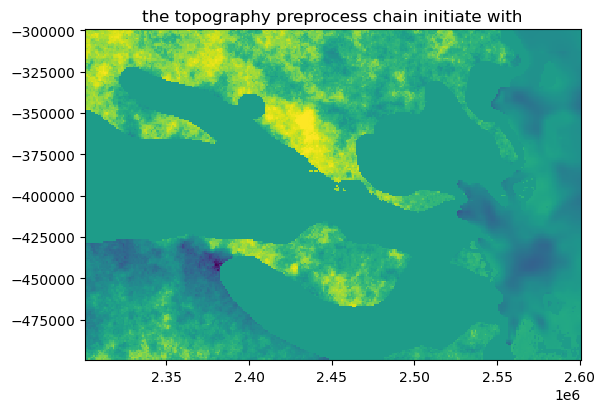

In [26]:
plt.pcolormesh(xx,yy,bed)
plt.title('the topography preprocess chain initiate with')
plt.axis('scaled')

In [27]:
mc_res_start = geomc.calc_mass_conservation(bed, surf, velx, vely, dhdt, smb)
print('the mass conservation residual preprocess chain start with')
geomc.loss_mc(mc_res_start, 'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)

the mass conservation residual preprocess chain start with


5526786.546631487

In [28]:
mc_res_bm = geomc.calc_mass_conservation(df_bm.bed.values.reshape(xx.shape), surf, velx, vely, dhdt, smb)
print('the mass conservation residual of bedmachine')
geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)

the mass conservation residual of bedmachine


3669701.4794974984

In [20]:
cond_bed = df.bed.values.reshape((rows,cols))
cond_data_mask = ~np.isnan(cond_bed)

In [30]:
radardiff = df_bm.bed.values.reshape((rows,cols)) - df.bed.values.reshape((rows,cols))
radardiff_sr2 = radardiff[mask_final==1]
mc_res_bm_sr2 = mc_res_bm[mask_final==1]

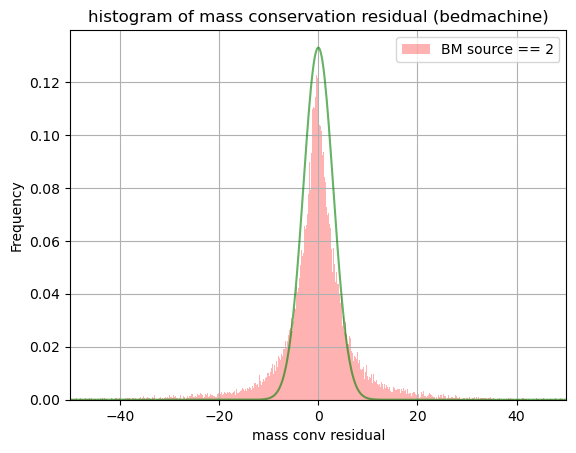

In [31]:
sigma3 = 3
xl3=np.linspace(-100, 100, num=1000)
gaussian_model=1/(sigma3*np.sqrt(2*np.pi))*np.exp(-0.5*np.square(xl3/sigma3))
#laplacian_model=1/(2*sigma4)*np.exp(-1*np.abs(xl3)/sigma4)

mc_res_bm_f = mc_res_bm.flatten()
mc_res_bm_f = mc_res_bm_f[~np.isnan(mc_res_bm_f)]
mc_res_bm_sr2_f = mc_res_bm_sr2.flatten()
mc_res_bm_sr2_f = mc_res_bm_sr2_f[~np.isnan(mc_res_bm_sr2_f)]
bins=np.histogram(np.hstack((mc_res_bm_f,mc_res_bm_sr2_f)), bins=5000)[1] #get the bin edges

#plt.hist(mc_res_bm_f, bins=bins, facecolor='blue', alpha=0.2,density=True,label='entire domain')
plt.hist(mc_res_bm_sr2_f, bins=bins, facecolor='red', alpha=0.3,density=True,label='BM source == 2')
plt.plot(xl3, gaussian_model, color='Green',alpha=0.6)
#plt.plot(xl3, laplacian_model, color='Orange',alpha=0.6)
plt.xlim([-50,50]);
#plt.ylim([0,0.04])
plt.legend()
plt.xlabel('mass conv residual');
plt.ylabel('Frequency');
plt.title('histogram of mass conservation residual (bedmachine)')
plt.grid(True)
plt.savefig('hist1.png')

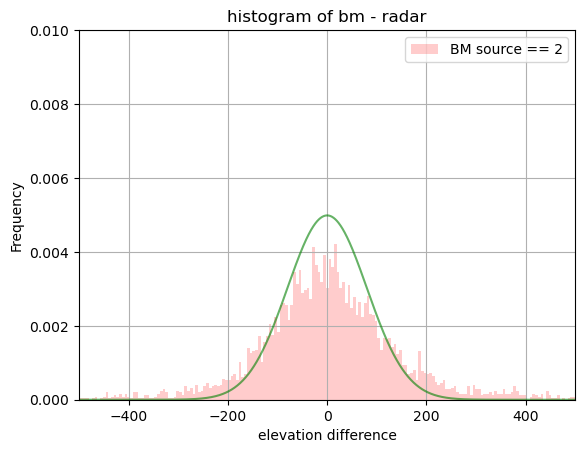

In [33]:
sigma3 = 80
xl3=np.linspace(-1000, 1000, num=5000)
gaussian_model=1/(sigma3*np.sqrt(2*np.pi))*np.exp(-0.5*np.square(xl3/sigma3))

radardiff_f = radardiff.flatten()
radardiff_f = radardiff_f[~np.isnan(radardiff_f)]
radardiff_sr2_f = radardiff_sr2.flatten()
radardiff_sr2_f = radardiff_sr2_f[~np.isnan(radardiff_sr2_f)]
bins=np.histogram(np.hstack((radardiff_f,radardiff_sr2_f)), bins=1000)[1] #get the bin edges

#plt.hist(radardiff_f, bins=bins, facecolor='blue', alpha=0.2,density=True,label='entire domain')
plt.hist(radardiff_sr2_f, bins=bins, facecolor='red', alpha=0.2,density=True,label='BM source == 2')
plt.plot(xl3, gaussian_model, color='Green',alpha=0.6)
plt.legend()
plt.xlim([-500,500]); 
plt.ylim([0.0,0.01]); 
plt.xlabel('elevation difference');
plt.ylabel('Frequency');
plt.title('histogram of bm - radar')
plt.grid(True)
plt.savefig('hist2.png')

In [34]:
file_index = '55'

In [38]:
# define parameters
n_iter_list =  [5000] * 12
n_iter_list.append(1000)
n_iter_list.append(1000)
sigma_mc_list = [3] * 14
sigma_data_list = [80] * 14
param_list = [[50e3, 5e3, [50,100], [(50,50),(200,200)]]] * 14
file_postfix_list = ['_'+file_index+'_prep_'+str(i) for i in range(1,13)]
file_postfix_list.append('_'+file_index+'_prep_'+'13foravg')
file_postfix_list.append('_'+file_index+'_prep_'+'14foravg')
choice_param_list = [500] * 12
choice_param_list.append(1)
choice_param_list.append(1)

resolution = 1000
logistic_param = [2,0,6,1]
mc_loss_type = 'sumsq'
data_loss = True
data_loss_type = 'sumsq'
maxdist = vario1_radar[2]
covariance_type = 'Gaussian'
isotropic = True
conditional= False
mcloss_in_high_vel = True
dataloss_in_high_vel = True
onlychange_in_highvel = True

In [92]:
# define parameters
n_iter_list =  [1000,1000]
sigma_mc_list = [3] * 2
sigma_data_list = [80] * 2
param_list = [[50e3, 5e3, [50,100], [(50,50),(200,200)]]] * 2
file_postfix_list = []
file_postfix_list.append('_'+file_index+'_prep_'+'15foravg')
file_postfix_list.append('_'+file_index+'_prep_'+'16foravg')
choice_param_list = [1] * 2

resolution = 1000
logistic_param = [2,0,6,1]
mc_loss_type = 'sumsq'
data_loss = True
data_loss_type = 'sumsq'
maxdist = vario1_radar[2]
covariance_type = 'Gaussian'
isotropic = True
conditional= False
mcloss_in_high_vel = True
dataloss_in_high_vel = True
onlychange_in_highvel = True

In [93]:
loaded_bed_temp = np.loadtxt("./bed_cache_55_prep_14foravg.txt")
loaded_bed_temp = loaded_bed_temp.reshape(np.round(loaded_bed_temp.size/(rows*cols)).astype(int), rows, cols)

In [94]:
bed = loaded_bed_temp[-1,:,:]

In [95]:
mc_res = geomc.calc_mass_conservation(bed, surf, velx, vely, dhdt, smb)
geomc.loss_mc(mc_res, 'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)

1400782.5402378219

In [96]:
maxdist

40686.10673128956

In [97]:
#start crf in stages for easier storage
begin_time = time.time()

for i in range(0,len(n_iter_list)):
    print('the i is ', i)
    
    n_iter = n_iter_list[i]
    file_postfix = file_postfix_list[i]
    choice_param = choice_param_list[i]
    
    range_max = [param_list[i][0], param_list[i][0]]
    range_min = [param_list[i][1], param_list[i][1]]
    step_range = param_list[i][2]
    block_size = param_list[i][3]
    nug_max = 0.0
    
    rfgen_param = [range_max, range_min, step_range, nug_max]
    
    sigma_mc = sigma_mc_list[i]
    sigma_data = sigma_data_list[i]

    bed_cache, loss_mc_cache, loss_data_cache, loss_cache, step_cache, resampled_times, blocks_cache = geomc.sample_both_block_logi(
       bed, surf, velx, vely, dhdt, smb,
       cond_bed, ~np.isnan(cond_bed), resolution,
       n_iter, block_size, rfgen_param, mc_loss_type, sigma_mc, 
       logistic_param = logistic_param, mc_region_mask = mask_final,
       sigma_data = sigma_data, maxdist = maxdist, crf_weight = -1,
       data_loss=data_loss, data_loss_type=data_loss_type, CRF = conditional, 
       mcloss_in_high_vel = mcloss_in_high_vel, dataloss_in_high_vel = dataloss_in_high_vel, onlychange_in_highvel = onlychange_in_highvel, 
       isotropic=isotropic, model_name = covariance_type)

    bed = bed_cache[-1]

    if choice_param == 1:
        np.savetxt("bed_cache"+file_postfix+".txt", bed_cache[:n_iter,:,:].reshape(n_iter, -1))
    else:
        choice = np.round(np.linspace(0, n_iter-choice_param, num=int(n_iter/choice_param))).astype(int)
        np.savetxt("bed_cache"+file_postfix+".txt", bed_cache[choice,:,:].reshape(len(choice), -1))

    np.savetxt("loss_cache"+file_postfix+".txt",loss_cache[:n_iter])
    np.savetxt("loss_mc_cache"+file_postfix+".txt",loss_mc_cache[:n_iter])
    np.savetxt("loss_data_cache"+file_postfix+".txt",loss_data_cache[:n_iter])
    np.savetxt("step_cache"+file_postfix+".txt",step_cache[:n_iter])
    np.savetxt("resampled_times"+file_postfix+".txt",resampled_times)
    np.savetxt("blocks_cache"+file_postfix+".txt",blocks_cache)
    
end_time = time.time()
used_time = end_time - begin_time
print('used ', used_time, ' seconds')

the i is  0
i: 100 mc loss: 1.398e+06 data loss: 6.094e+08 loss: 1.253e+05 acceptance rate: 0.04
i: 200 mc loss: 1.397e+06 data loss: 6.106e+08 loss: 1.253e+05 acceptance rate: 0.04
i: 300 mc loss: 1.397e+06 data loss: 6.094e+08 loss: 1.252e+05 acceptance rate: 0.056666666666666664
i: 400 mc loss: 1.390e+06 data loss: 6.143e+08 loss: 1.252e+05 acceptance rate: 0.0625
i: 500 mc loss: 1.388e+06 data loss: 6.155e+08 loss: 1.252e+05 acceptance rate: 0.066
i: 600 mc loss: 1.393e+06 data loss: 6.118e+08 loss: 1.252e+05 acceptance rate: 0.065
i: 700 mc loss: 1.393e+06 data loss: 6.120e+08 loss: 1.252e+05 acceptance rate: 0.06142857142857143
i: 800 mc loss: 1.393e+06 data loss: 6.116e+08 loss: 1.252e+05 acceptance rate: 0.0575
i: 900 mc loss: 1.393e+06 data loss: 6.115e+08 loss: 1.252e+05 acceptance rate: 0.05444444444444444
the i is  1
i: 100 mc loss: 1.393e+06 data loss: 6.113e+08 loss: 1.252e+05 acceptance rate: 0.04
i: 200 mc loss: 1.396e+06 data loss: 6.095e+08 loss: 1.252e+05 acceptance 

### visualization

In [41]:
n_iter_list_1 =  [5000] * 12
param_list_1 = [[50e3, 5e3, [50,200], [(50,50),(200,200)]]] * 12
file_postfix_list_1 = ['_55_prep_'+str(i) for i in range(1,13)]
choice_param_list_1 = [500] * 12

In [100]:
n_iter_list_1 =  [1000] * 4
param_list_1 = [[50e3, 5e3, [50,200], [(50,50),(200,200)]]] * 4
file_postfix_list_1 = ['_55_prep_'+str(i)+'foravg' for i in range(13,17)]
choice_param_list_1 = [1] * 4

In [101]:
mc_loss_1 = np.zeros(np.sum(n_iter_list_1))
data_loss_1 = np.zeros(np.sum(n_iter_list_1))
step_1 = np.zeros(np.sum(n_iter_list_1))
blocks_1 = np.zeros((np.sum(n_iter_list_1),4))
for i in range(len(n_iter_list_1)):
    file_postfix = file_postfix_list_1[i]
    mc_loss_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./loss_mc_cache"+file_postfix+".txt")
    data_loss_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./loss_data_cache"+file_postfix+".txt")
    step_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./step_cache"+file_postfix+".txt")
    blocks_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./blocks_cache"+file_postfix+".txt")

In [102]:
# load file
nsil = np.floor(np.divide(n_iter_list_1, choice_param_list_1)).astype(int)
loaded_bed_1 = np.zeros((np.sum(nsil), rows, cols))
resampled_times_1 = np.zeros((len(n_iter_list_1), rows, cols))
for i in range(len(nsil)):
    file_postfix = file_postfix_list_1[i]
    loaded_bed_temp = np.loadtxt("./bed_cache"+file_postfix+".txt")
    loaded_bed_temp = loaded_bed_temp.reshape(np.round(loaded_bed_temp.size/(rows*cols)).astype(int), rows, cols)
    loaded_bed_1[int(np.sum(nsil[:i])):int(np.sum(nsil[:i+1])),:,:] = loaded_bed_temp
    resampled_times_1[i,:,:] = np.loadtxt("./resampled_times"+file_postfix+".txt").reshape(rows, cols)
    
mse_loss_1 = np.zeros(np.sum(nsil))
for i in range(loaded_bed_1.shape[0]):
    mc_res_now = geomc.calc_mass_conservation(loaded_bed_1[i], surf, velx, vely, dhdt, smb)
    mse_loss_1[i] = geomc.loss_mc(mc_res_now, 'sumabs', inside_high_vel_region = False)

In [103]:
loss_mc_bm = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)
loss_mc_bm

3669701.4794974984

In [104]:
loss_data_bm = geomc.loss_data(df_bm.bed.values.reshape(xx.shape), cond_bed, cond_data_mask, 
                              'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)
loss_data_bm

607999609.7506663

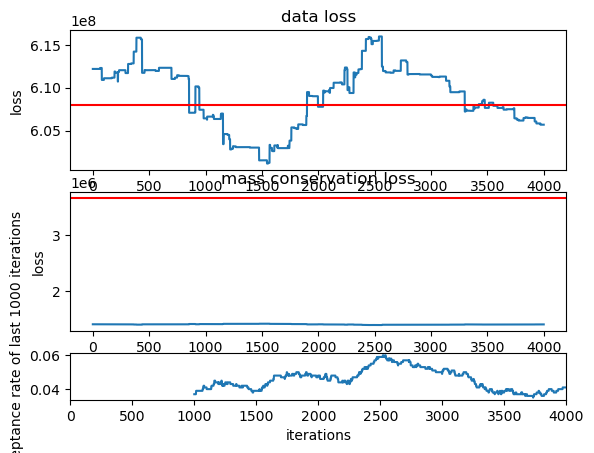

In [105]:
fig = geomc.plot_loss(np.array([mc_loss_1]), np.array([step_1]), loss_mc_bm, has_dataloss = True, 
                      loss_data_cache = np.array([data_loss_1]), data_loss_bm = loss_data_bm)

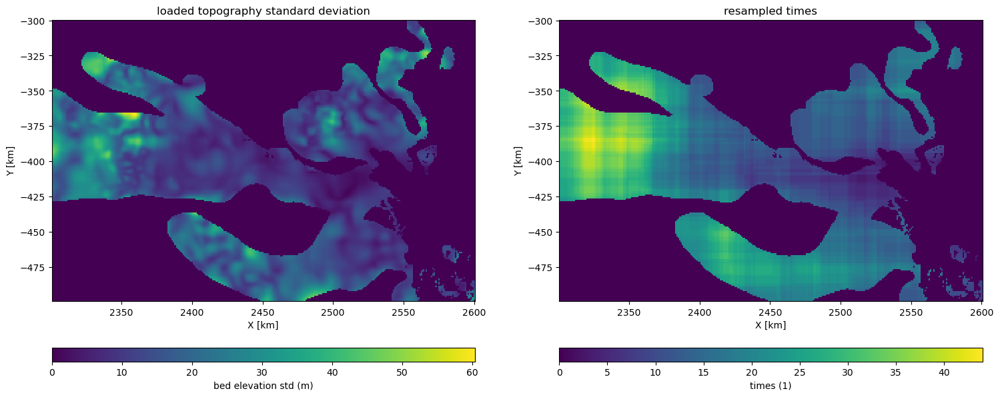

In [106]:
fig = geomc.plot_sample(loaded_bed_1, resampled_times_1, xx, yy)

(2300500.0, 2600500.0, -499500.0, -299500.0)

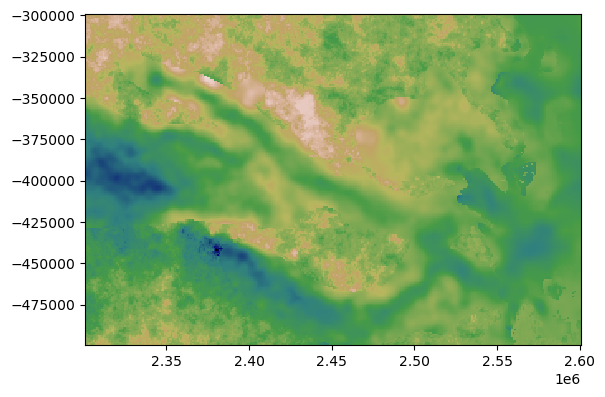

In [107]:
plt.pcolormesh(xx,yy,loaded_bed_1[-1],vmax=2000,vmin=-2500,cmap='gist_earth')
#plt.pcolormesh(xx,yy,cond_bed,vmax=2000,vmin=-2500,cmap='grey')
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

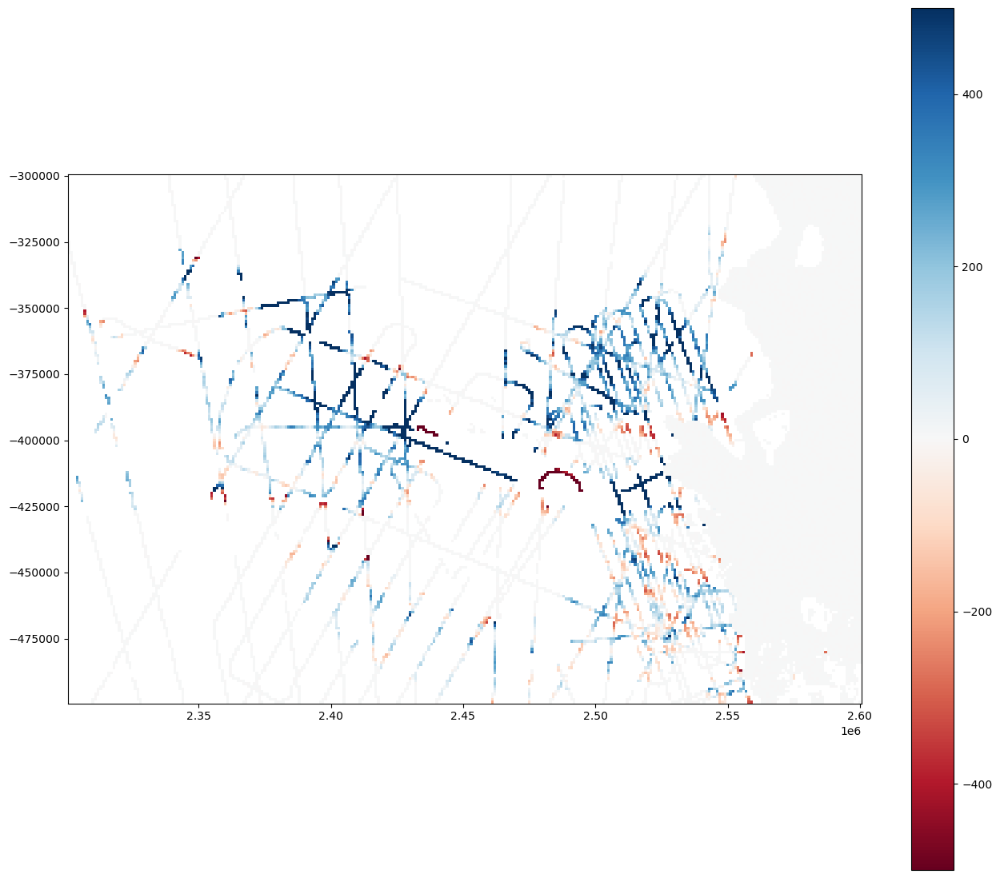

In [108]:
plt.figure(figsize=(16,14))
plt.pcolormesh(xx,yy,loaded_bed_1[-1]-cond_bed,vmax=500,vmin=-500,cmap='RdBu')
plt.colorbar()
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

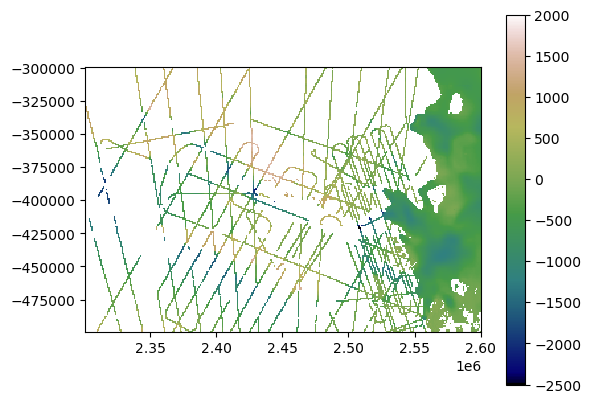

In [109]:
plt.pcolormesh(xx,yy,cond_bed,vmax=2000,vmin=-2500,cmap='gist_earth')
plt.colorbar()
plt.axis('scaled')

In [110]:
geomc.loss_data(loaded_bed_1[-1], cond_bed, cond_data_mask, 
                'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)

605688032.6021676

In [111]:
mc_res = geomc.calc_mass_conservation(loaded_bed_1[-1], surf, velx, vely, dhdt, smb)
geomc.loss_mc(mc_res, 'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)

1398854.9995774117

In [112]:
geomc.loss_mc(mc_res, 'sumsq', inside_high_vel_region = False), geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = False)

(2115647.0520855514, 4293710.7919969605)

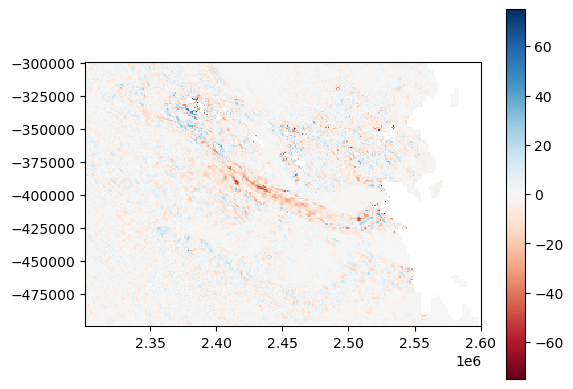

In [113]:
plt.pcolormesh(xx,yy,mc_res,vmax=75,vmin=-75,cmap='RdBu')
plt.axis('scaled')
plt.colorbar()

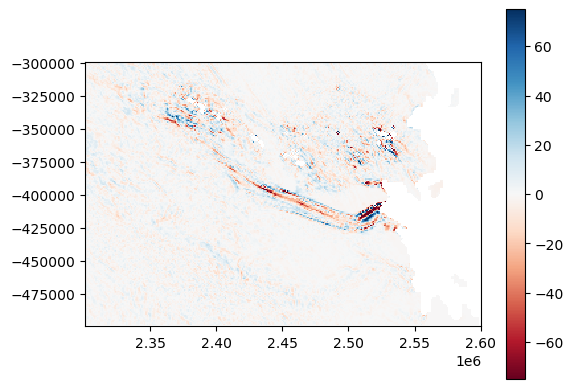

In [114]:
plt.pcolormesh(xx,yy,mc_res_bm,vmax=75,vmin=-75,cmap='RdBu')
plt.axis('scaled')
plt.colorbar()

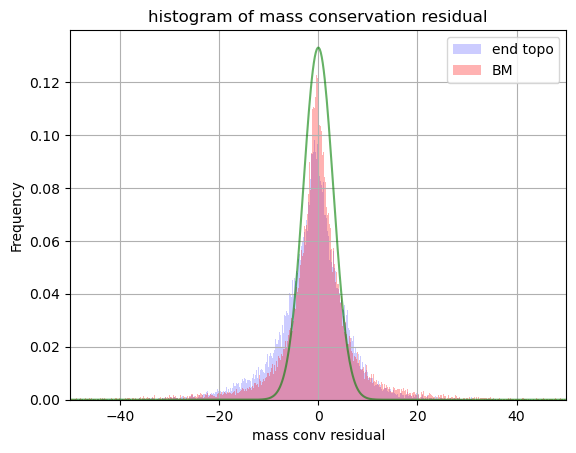

In [115]:
sigma3 = 3
#sigma4 = 3.8
xl3=np.linspace(-100, 100, num=1000)
gaussian_model=1/(sigma3*np.sqrt(2*np.pi))*np.exp(-0.5*np.square(xl3/sigma3))
#laplacian_model=1/(2*sigma4)*np.exp(-1*np.abs(xl3)/sigma4)

mc_res_bm_sr2 = mc_res_bm[mask_final==1]
mc_res_bm_sr2_f = mc_res_bm_sr2.flatten()
mc_res_bm_sr2_f = mc_res_bm_sr2_f[~np.isnan(mc_res_bm_sr2_f)]
mc_res_sr2 = mc_res[mask_final==1]
mc_res_sr2_f = mc_res_sr2.flatten()
mc_res_sr2_f = mc_res_sr2_f[~np.isnan(mc_res_sr2_f)]
bins=np.histogram(np.hstack((mc_res_sr2_f,mc_res_bm_sr2_f)), bins=5000)[1] #get the bin edges

plt.hist(mc_res_sr2_f, bins=bins, facecolor='blue', alpha=0.2,density=True,label='end topo')
plt.hist(mc_res_bm_sr2_f, bins=bins, facecolor='red', alpha=0.3,density=True,label='BM')
plt.plot(xl3, gaussian_model, color='Green',alpha=0.6)
#plt.plot(xl3, laplacian_model, color='Orange',alpha=0.6)
plt.xlim([-50,50]);
#plt.ylim([0,0.04])
plt.legend()
plt.xlabel('mass conv residual');
plt.ylabel('Frequency');
plt.title('histogram of mass conservation residual')
plt.grid(True)
plt.show()

### average last 4000 beds, exlucde certain data

In [14]:
avg_beds = np.loadtxt("./55_prep/bed_cache_55_prep_13foravg"+".txt")
avg_beds = avg_beds.reshape(np.round(avg_beds.size/(rows*cols)).astype(int), rows, cols)
avg_bed = np.mean(avg_beds, axis=0)

(2300500.0, 2600500.0, -499500.0, -299500.0)

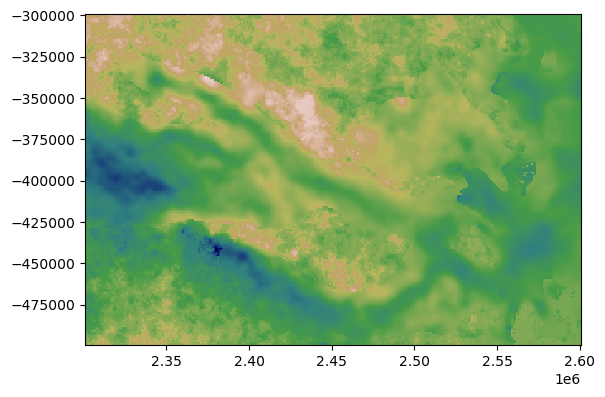

In [15]:
plt.pcolormesh(xx,yy,avg_bed,vmax=2000,vmin=-2500,cmap='gist_earth')
#plt.pcolormesh(xx,yy,cond_bed,vmax=2000,vmin=-2500,cmap='grey')
plt.axis('scaled')

In [307]:
avg_beds2 = np.loadtxt("./bed_cache_"+"38_1_14foravg"+".txt")
avg_beds2 = avg_beds2.reshape(np.round(avg_beds2.size/(rows*cols)).astype(int), rows, cols)
avg_bed2 = np.mean(avg_beds2, axis=0)

(2300500.0, 2600500.0, -499500.0, -299500.0)

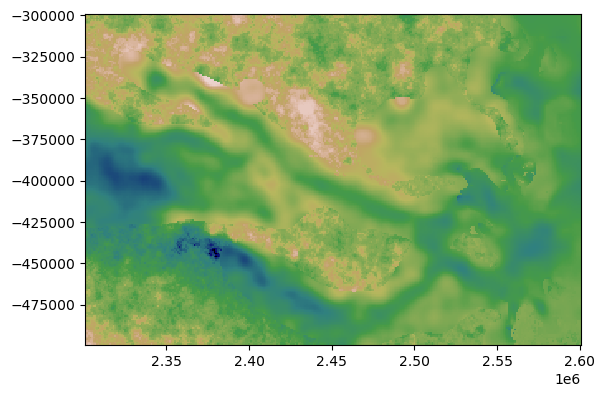

In [308]:
plt.pcolormesh(xx,yy,avg_bed2,vmax=2000,vmin=-2500,cmap='gist_earth')
#plt.pcolormesh(xx,yy,cond_bed,vmax=2000,vmin=-2500,cmap='grey')
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

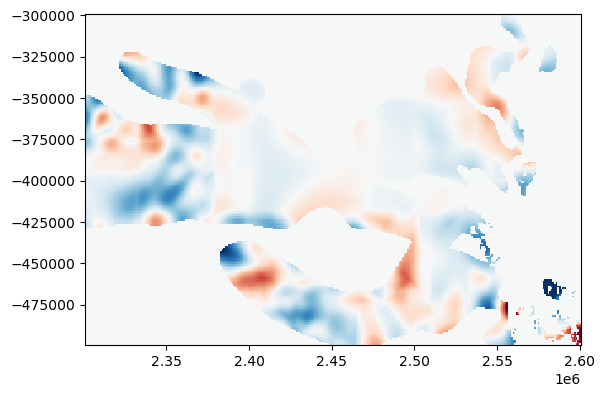

In [309]:
plt.pcolormesh(xx,yy,avg_bed - avg_bed2,vmax=100,vmin=-100,cmap='RdBu')
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

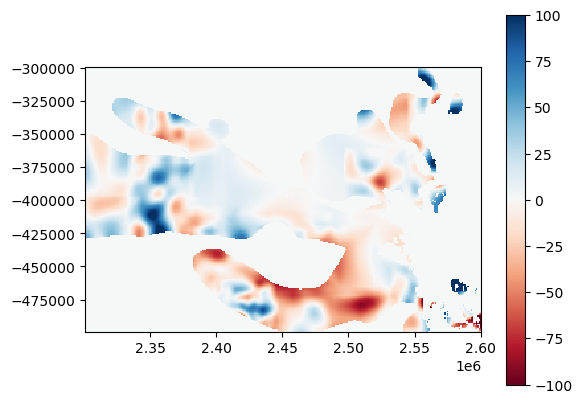

In [303]:
plt.pcolormesh(xx,yy,avg_beds[0,:,:] - avg_beds[-1,:,:],vmax=100,vmin=-100,cmap='RdBu')
plt.colorbar()
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

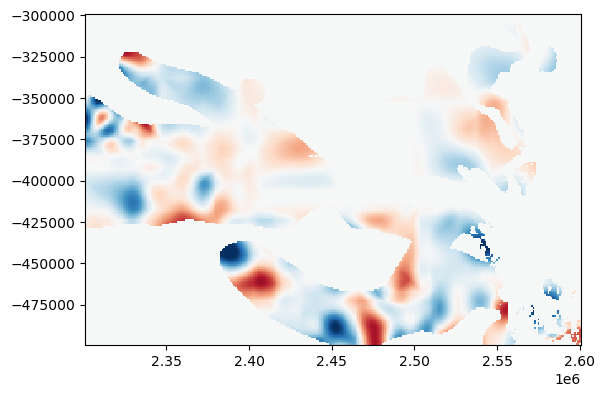

In [311]:
plt.pcolormesh(xx,yy,avg_beds2[0,:,:] - avg_beds2[-1,:,:],vmax=100,vmin=-100,cmap='RdBu')
plt.axis('scaled')

In [16]:
n_iter_list_avg =  [1000] * 4
file_postfix_list_avg = ['_55_prep_'+str(i)+'foravg' for i in range(13,17)]
choice_param_list_avg = [1] * 4

In [17]:
# load file
nsil = np.floor(np.divide(n_iter_list_avg, choice_param_list_avg)).astype(int)
loaded_bed_avg = np.zeros((np.sum(nsil), rows, cols))
for i in range(len(nsil)):
    file_postfix = file_postfix_list_avg[i]
    loaded_bed_temp = np.loadtxt("./55_prep/bed_cache"+file_postfix+".txt")
    loaded_bed_temp = loaded_bed_temp.reshape(np.round(loaded_bed_temp.size/(rows*cols)).astype(int), rows, cols)
    loaded_bed_avg[int(np.sum(nsil[:i])):int(np.sum(nsil[:i+1])),:,:] = loaded_bed_temp

In [18]:
avg_bed = np.mean(loaded_bed_avg, axis=0)

the standard deviation of difference to conditioning data is 186.6554100188315
the exclusion rate is 0.007821570424686832


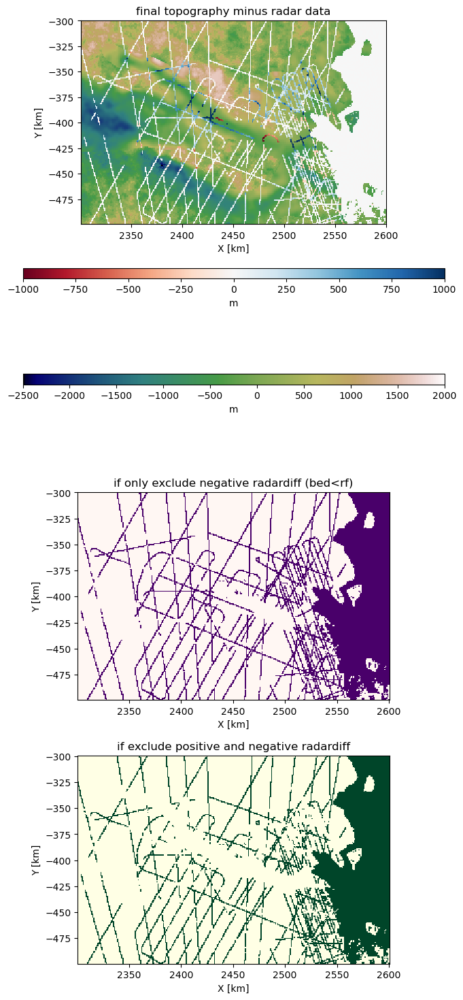

In [21]:
df_out = geomc.exclude_data_rf(df, avg_bed, cond_bed, 1.5, xx, yy, shallow=True)
df_out = df_out.reset_index()

In [22]:
186*1.5

279.0

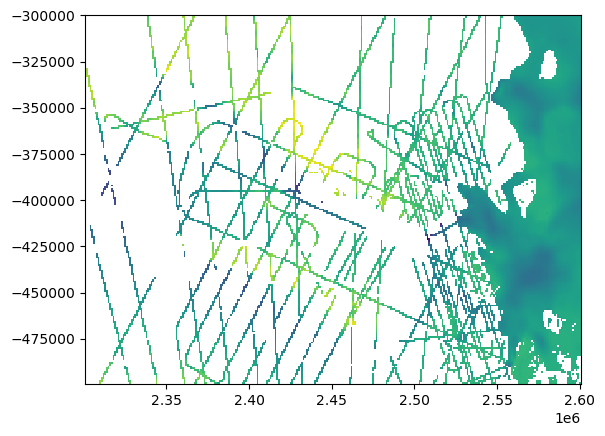

In [122]:
plt.pcolormesh(xx,yy,df_out.bedQCrf.values.reshape(xx.shape))

In [123]:
xcmin = 80
xcmax = 107
ycmin = 130
ycmax = 175

(2430500.0, 2475500.0, -419500.0, -392500.0)

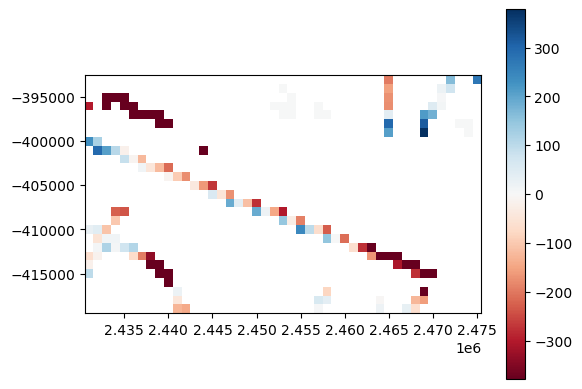

In [124]:
bmradardiff = df_bm.bed.values.reshape(xx.shape) - cond_bed
stdbm = np.nanstd(bmradardiff)
plt.pcolormesh(xx[xcmin:xcmax,ycmin:ycmax],yy[xcmin:xcmax,ycmin:ycmax],bmradardiff[xcmin:xcmax,ycmin:ycmax],vmax=stdbm*1.8,vmin=-stdbm*1.8, cmap='RdBu')
plt.colorbar()
plt.axis('scaled')

(2430500.0, 2475500.0, -419500.0, -392500.0)

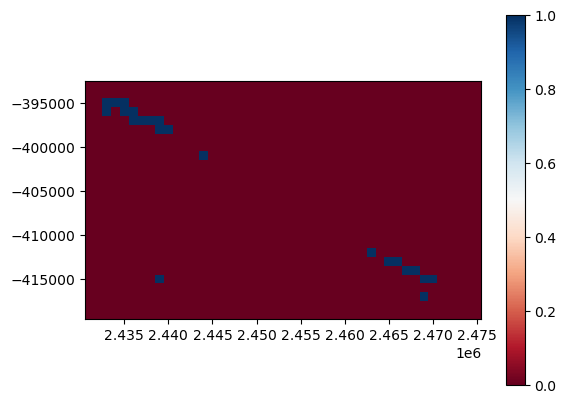

In [125]:
plt.pcolormesh(xx[xcmin:xcmax,ycmin:ycmax],yy[xcmin:xcmax,ycmin:ycmax],bmradardiff[xcmin:xcmax,ycmin:ycmax]<-stdbm*2, cmap='RdBu')
plt.colorbar()
plt.axis('scaled')

In [126]:
xpmin = xx[xcmin,ycmin]
xpmax = xx[xcmax,ycmax]
ypmin = yy[xcmin,ycmin]
ypmax = yy[xcmax,ycmax]

In [127]:
exclude_index = df_bm[((df_bm.bed-df_out.bedQCrf)<-stdbm*2)&(df_bm.x>=xpmin)&(df_bm.x<=xpmax)&(df_bm.y>=ypmin)&(df_bm.y<=ypmax)&(df_out.bedQCrf!=np.nan)].index

In [128]:
df_out.loc[exclude_index,'bedQCrf'] = np.nan

In [129]:
np.savetxt('denman_extra_excluded_index_55.txt',exclude_index.values)

In [ ]:
# df_out2 = geomc.exclude_data_neariceshelf(df_out,1000,3,dfmaskname='bedmachine_mask',bedindex='bedQCrf')

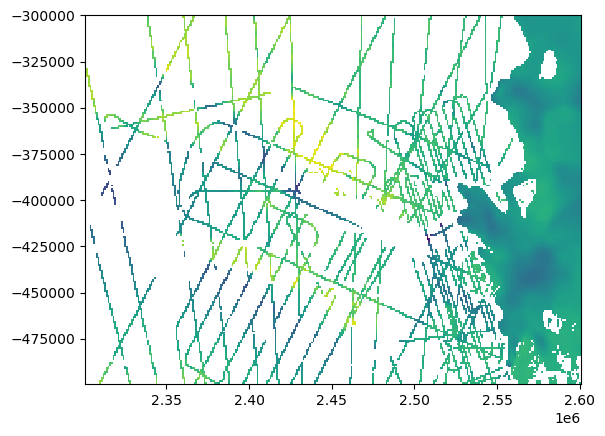

In [432]:
# plt.pcolormesh(xx,yy,df_out2.bedQCrf.values.reshape(xx.shape))
# plt.scatter(df_out.iloc[exclude_index].X,df_out.iloc[exclude_index].Y,s=0.5,color='red')

In [440]:
# df_out2['mask'] = mask_final.flatten()

In [461]:
# df_out2.to_csv('./compiled_Denman_QC_38_1_shallow.csv', index=False, header=True)  

In [131]:
df_out['mask'] = mask_final.flatten()

In [148]:
df_out.to_csv('./compiled_Denman_QC_55_shallow.csv', index=False, header=True)  

In [149]:
df = df.reset_index()

In [150]:
df_excluded = df[(~df['bed'].isna())&(df_out['bedQCrf'].isna())]

In [177]:
df_excluded

,level_0,index,X,Y,Sum,Count,bed,bedmachine_mask,surface,vel_x,vel_y
257,257,2016657,2558000.0,-499000.0,5878.990,66.0,89.075606,2,339.890,-0.770059,10.835674
258,258,2016658,2559000.0,-499000.0,417.750,4.0,104.437500,2,313.580,-0.874826,6.541532
557,557,2018206,2558000.0,-498000.0,168.890,70.0,2.412714,2,313.540,-3.196138,11.317242
3854,3854,2035242,2555000.0,-487000.0,1714.580,13.0,131.890769,2,152.500,9.223374,14.767440
5955,5955,2046086,2556000.0,-480000.0,1715.070,27.0,63.521111,2,81.334,6.428048,12.768096
...,...,...,...,...,...,...,...,...,...,...,...
44406,44406,2245658,2307000.0,-351000.0,20460.974,24.0,852.540583,2,2111.900,5.047187,-12.167873
44466,44466,2245718,2367000.0,-351000.0,66001.040,73.0,904.123836,2,1799.300,60.078011,-33.752257
44467,44467,2245719,2368000.0,-351000.0,48361.540,62.0,780.024839,2,1792.100,60.033563,-40.826009
50448,50448,2276680,2349000.0,-331000.0,31503.310,23.0,1369.709130,2,2027.100,14.474070,-23.137171


In [178]:
df_excluded.to_csv('./excluded_Denman_QC_55_shallow.csv', index=False, header=True)

In [162]:
df_out[(~df_out.bed.isna())&(df_out['mask']==True)]

,index,X,Y,Sum,Count,bed,bedmachine_mask,surface,vel_x,vel_y,bedQCrf,bedrf,mask
160,2016560,2461000.0,-499000.0,-7992.41,18.0,-444.022778,2,1414.00,33.460916,6.432445,-444.022778,-613.596060,True
174,2016574,2475000.0,-499000.0,-829.20,8.0,-103.650000,2,1332.50,29.708133,9.964566,-103.650000,-160.437708,True
246,2016646,2547000.0,-499000.0,3754.90,39.0,96.279487,2,529.77,40.345032,24.152129,96.279487,-40.878360,True
247,2016647,2548000.0,-499000.0,4026.59,53.0,75.973396,2,496.51,47.177307,30.137268,75.973396,-24.148157,True
248,2016648,2549000.0,-499000.0,232.36,3.0,77.453333,2,451.53,49.212366,37.265396,77.453333,-3.595551,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
53942,2293913,2543000.0,-320000.0,6530.80,65.0,100.473846,2,725.24,34.683210,-23.620307,100.473846,155.655697,True
53948,2293919,2549000.0,-320000.0,1436.12,15.0,95.741333,2,581.34,27.739408,-20.384583,95.741333,123.465102,True
54242,2295462,2543000.0,-319000.0,7739.76,66.0,117.269091,2,735.56,30.342183,-17.090836,117.269091,119.063111,True
59652,2323354,2553000.0,-301000.0,1111.05,13.0,85.465385,2,530.15,39.232469,24.471662,85.465385,53.534834,True


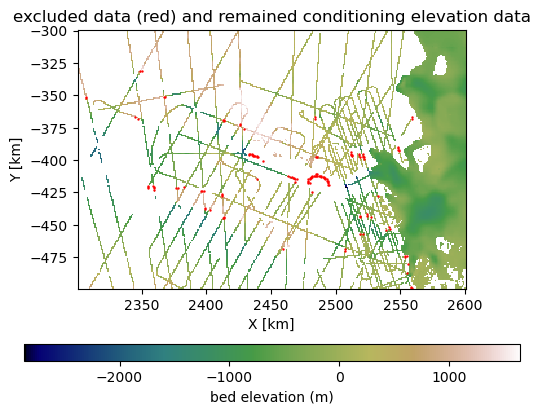

In [176]:
plt.pcolormesh(xx/1000,yy/1000,df_out.bedQCrf.values.reshape(xx.shape), cmap='gist_earth')
plt.colorbar(aspect=30, label='bed elevation (m)',orientation='horizontal')
plt.scatter(df_excluded.X/1000,df_excluded.Y/1000,s=0.5,color='red')
plt.xlabel('X [km]')
plt.ylabel('Y [km]')
plt.axis('scaled')
plt.title('excluded data (red) and remained conditioning elevation data')
plt.savefig('excluded_radar_data.png',bbox_inches='tight',dpi=300)

## CRF

In [244]:
df = pd.read_csv('./compiled_Denman_QC_38_1_shallow.csv')
df=df.rename(columns={"bed": "bed_notpreprocessed"})
df=df.rename(columns={"bedQCrf": "bed"})

x_uniq = np.unique(df.X)
y_uniq = np.unique(df.Y)

xmin = np.min(x_uniq)
xmax = np.max(x_uniq)
ymin = np.min(y_uniq)
ymax = np.max(y_uniq)

cols = len(x_uniq)
rows = len(y_uniq)

resolution = 1000

xx, yy = np.meshgrid(x_uniq, y_uniq)
xx.shape

(200, 300)

1.32549273167603 1.3202704 0.18121015647151228 0.20660445


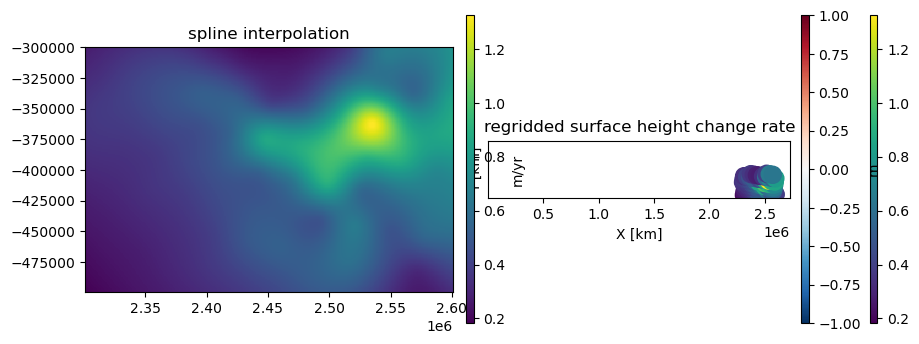

In [245]:
smb, fig1 = geomc.load_smb('./Data/SMB_RACMO2.3p2_yearly_ANT27_1979_2016.nc',xx,yy)
dhdt, fig2 = geomc.load_dhdt('./Data/ANT_G1920_GroundedIceHeight_v01.nc',xx,yy)
surf = df.surface.values.reshape((rows,cols))
velx = df.vel_x.values.reshape((rows,cols))
vely = df.vel_y.values.reshape((rows,cols))

data_index = df[df["bed"].isnull() == False].index
mask_index = df[df["mask"]==1].index

range, sill, and nugget for gaussian variogram is  [36584.13953787169, 1.3219823253615948, 0]
for exponential variogram is  [63283.45622775321, 1.4908586216973383, 0]
for spherical variogram is  [46093.97846986654, 1.374347211690367, 0]


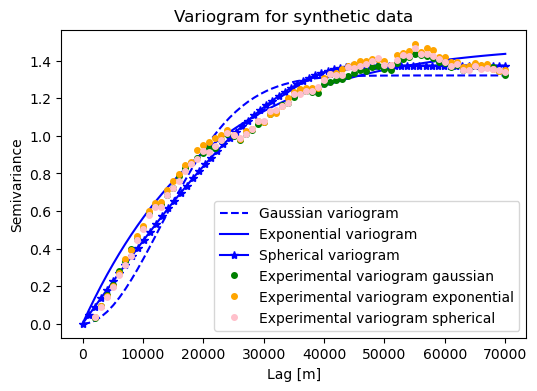

In [247]:
df_bed = df.copy()
df_bed = df_bed[df_bed["bed"].isnull() == False]
data = df_bed['bed'].values.reshape(-1,1)
coords = df_bed[['X','Y']].values
roughness_region_mask = (df_bed['bedmachine_mask'].values)==2

nst_trans, Nbed_radar, varios, fig = geomc.fit_variogram(data, coords, roughness_region_mask, maxlag=70000, n_lags=70)

In [248]:
# save variogram parameters as a list
# vario1_radar = [azimuth, nugget, major_range, minor_range, sill, vtype]
vario1_radar = [0, 0, 45687.9402279064, 45687.9402279064, 1.4012725206478585, 'Spherical']

In [249]:
df_bed['Nbed_radar'] = Nbed_radar.flatten()

In [ ]:
k = 48
rad = 50000

Pred_grid_xy = gs.Gridding.prediction_grid(xmin, xmax, ymin, ymax, resolution)
x = np.reshape(Pred_grid_xy[:,0], (rows*cols, 1))
y = np.flip(np.reshape(Pred_grid_xy[:,1], (rows*cols, 1))) # need to flip y otherwise the coordinate does not match
Pred_grid_xy = np.concatenate((x,y),axis=1)

sim = gs.Interpolation.okrige_sgs(Pred_grid_xy, df_bed, 'X', 'Y', 'Nbed_radar', k, vario1_radar, rad)

# convert the first SGS matrix to a dataframe
x = np.reshape(Pred_grid_xy[:,0], (rows*cols, 1))
y = np.reshape(Pred_grid_xy[:,1], (rows*cols, 1))
xy_grid = np.concatenate((x,y,sim.flatten().reshape(-1,1)),axis=1)
psimdf = pd.DataFrame(data = xy_grid,columns=['X','Y','Z'],index=df.index)

sgs_bed = nst_trans.inverse_transform(np.array(psimdf['Z']).reshape(-1,1)).reshape(rows,cols)
np.savetxt('sgs_bed_38_3.txt',sgs_bed)


In [250]:
sgs_bed = np.loadtxt('sgs_bed_38_3.txt')

FileNotFoundError: sgs_bed_38_3.txt not found.

In [ ]:
plt.pcolormesh(xx,yy,sgs_bed)

In [251]:
cond_bed = df.bed.values.reshape((rows,cols))
cond_data_mask = ~np.isnan(cond_bed)

In [252]:
weight, dist, dist_rescale, dist_logi = geomc.get_crf_weight(xx,yy,logistic_param,cond_data_mask,max_dist=vario1_radar[2])

In [476]:
field = geomc.generate_RF(x_uniq,y_uniq,step_range,nug_max,range_min,range_max,model_name='Exponential',isotropic=True)

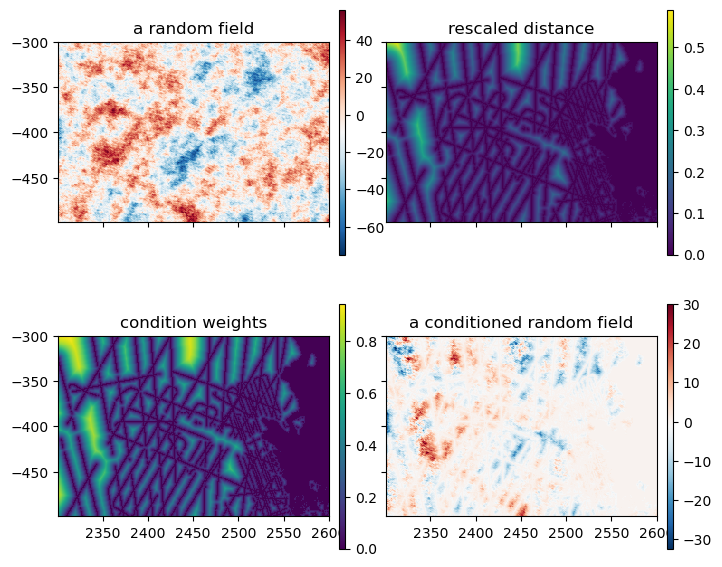

In [477]:
ds = [field,
      dist_rescale,
      weight,
      field * weight ]
titles = ['a random field', 'rescaled distance', 'condition weights', 'a conditioned random field']
cmaps = ['RdBu_r','viridis','viridis','RdBu_r']

fig, axs = plt.subplots(2, 2, figsize=(8.5,7), sharey=True, sharex=True,
                       gridspec_kw={'wspace':-0.01})

for ax, d, t, c in zip(axs.ravel(), ds, titles, cmaps):
    im = ax.pcolormesh(xx/1000, yy/1000, d, cmap=c)
    ax.set_title(t)
    ax.axis('scaled')
    plt.colorbar(im, ax=ax, pad=0.03, aspect=40)
plt.show()

In [253]:
df_bm = pd.read_csv('./Data/Aurora_bedmachine_data.csv')
df_bm = df_bm[(df_bm['x']>=xmin) & (df_bm['x']<=xmax) & (df_bm['y']>=ymin) & (df_bm['y']<=ymax)].copy()
df_bm = df_bm.reset_index()
mc_res_bm = geomc.calc_mass_conservation(df_bm.bed.values.reshape(rows,cols), surf, velx, vely, dhdt, smb)

In [309]:
loaded_bed_temp = np.loadtxt("./bed_cache"+'_38_3_40'+".txt")
loaded_bed_temp = loaded_bed_temp.reshape(np.round(loaded_bed_temp.size/(rows*cols)).astype(int), rows, cols)

In [310]:
#bed = sgs_bed
bed = loaded_bed_temp[-1]

In [ ]:
80000
every 4000 iteration sampled once, sample 20 times
80000 iters
4000 choice
1. sampled interval
2. resulting ensemble
3. use them as start topography for the sgs

In [305]:
40*5000

200000

In [ ]:
first plot autocorrelation of cells in crf
run a 5000 iter chain with choice = 1
record value of certain grid outside of the general bed
get the autocorrelation of randomly selected points on the map

In [266]:
index_xy, actual_xy = geomc.find_example_loc(30, cond_data_mask, mc_region_mask, xx, yy)

In [267]:
    color = ['#377eb8', '#ff7f00', '#4daf4a',
              '#f781bf', '#a65628', '#984ea3',
              '#999999', '#e41a1c', '#dede00','#57bee8',
            '#377eb8', '#ff7f00', '#4daf4a',
              '#f781bf', '#a65628', '#984ea3',
              '#999999', '#e41a1c', '#dede00','#57bee8',
            '#377eb8', '#ff7f00', '#4daf4a',
              '#f781bf', '#a65628', '#984ea3',
              '#999999', '#e41a1c', '#dede00','#57bee8']

(2300500.0, 2600500.0, -499500.0, -299500.0)

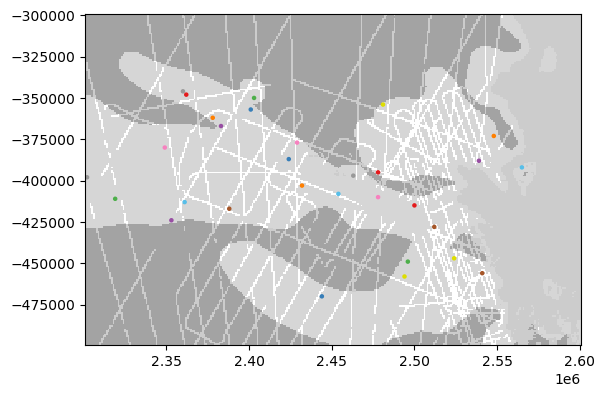

In [268]:
#plt.pcolormesh(xx,yy,trend,vmax=2000,vmin=-2500,cmap='gist_earth')
plt.pcolormesh(xx,yy,cond_data_mask,cmap='grey',alpha=0.2)
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.scatter(actual_xy[:,0],actual_xy[:,1],s=5,c=color)
plt.axis('scaled')

In [313]:
#define parameters
n_iter_list =  [5000] * 4
sigma_mc_list = [3] * 4
sigma_data_list = [-1] * 4
param_list = [[50e3, 10e3, [50,200], [(30,30),(70,70)]]] * 4
file_postfix_list = ['_38_3_'+str(i)+'forsample' for i in range(41,45)]
choice_param_list = [4000] * 4

resolution = 1000
logistic_param = [2,0,6,1]
mc_loss_type = 'sumsq'
data_loss = False
data_loss_type = 'default'
maxdist = vario1_radar[2]
covariance_type = 'Exponential'
isotropic = True
conditional= True
mcloss_in_high_vel = True
dataloss_in_high_vel = True
onlychange_in_highvel = True

In [313]:
#define parameters
n_iter_list =  [20000] * 4
sigma_mc_list = [3] * 4
sigma_data_list = [-1] * 4
param_list = [[50e3, 10e3, [50,200], [(30,30),(70,70)]]] * 4
file_postfix_list = ['_38_3_'+str(i)+'forsample' for i in range(41,45)]
choice_param_list = [4000] * 4

resolution = 1000
logistic_param = [2,0,6,1]
mc_loss_type = 'sumsq'
data_loss = False
data_loss_type = 'default'
maxdist = vario1_radar[2]
covariance_type = 'Exponential'
isotropic = True
conditional= True
mcloss_in_high_vel = True
dataloss_in_high_vel = True
onlychange_in_highvel = True

In [ ]:
#start crf in stages for easier storage
for i in range(0,len(n_iter_list)):
    n_iter = n_iter_list[i]
    file_postfix = file_postfix_list[i]
    choice_param = choice_param_list[i]
    
    range_max = [param_list[i][0], param_list[i][0]]
    range_min = [param_list[i][1], param_list[i][1]]
    step_range = param_list[i][2]
    block_size = param_list[i][3]
    nug_max = 0.0
    
    rfgen_param = [range_max, range_min, step_range, nug_max]
    
    sigma_mc = sigma_mc_list[i]
    sigma_data = sigma_data_list[i]

    bed_cache, loss_mc_cache, loss_cache, step_cache, resampled_times, blocks_cache = geomc.sample_both_block_logi(
       bed, surf, velx, vely, dhdt, smb,
       cond_bed, ~np.isnan(cond_bed), resolution,
       n_iter, block_size, rfgen_param, mc_loss_type, sigma_mc, 
       logistic_param = logistic_param, mc_region_mask = mc_region_mask,
       sigma_data = sigma_data, maxdist = maxdist, crf_weight = weight,
       data_loss=data_loss, data_loss_type=data_loss_type, CRF = conditional, 
       mcloss_in_high_vel = mcloss_in_high_vel, dataloss_in_high_vel = dataloss_in_high_vel, onlychange_in_highvel = onlychange_in_highvel, 
       isotropic=isotropic, model_name = covariance_type)
    
    example_values = bed_cache[:,index_xy[:,0].astype('int'),index_xy[:,1].astype('int')]

    bed = bed_cache[-1]

    if choice_param == 1: # save all data
        np.savetxt("bed_cache"+file_postfix+".txt", bed_cache[:n_iter,:,:].reshape(n_iter, -1))
    else: # save a topo per choice_param topo
        choice = np.round(np.linspace(0, n_iter-1, num=int(n_iter/choice_param))).astype(int)
        np.savetxt("bed_cache"+file_postfix+".txt", bed_cache[choice,:,:].reshape(len(choice), -1))

    np.savetxt("example_values"+file_postfix+".txt",example_values)
    np.savetxt("loss_cache"+file_postfix+".txt",loss_cache)
    np.savetxt("loss_mc_cache"+file_postfix+".txt",loss_mc_cache)
    #np.savetxt("loss_data_cache"+file_postfix+".txt",loss_data_cache[:n_iter])
    #np.savetxt("loss_data_in_cache"+file_postfix+".txt",loss_data_in_cache[:n_iter])
    #np.savetxt("loss_data_out_cache"+file_postfix+".txt",loss_data_out_cache[:n_iter])
    np.savetxt("step_cache"+file_postfix+".txt",step_cache)
    np.savetxt("resampled_times"+file_postfix+".txt",resampled_times)
    np.savetxt("blocks_cache"+file_postfix+".txt",blocks_cache)

In [301]:
example_values = np.zeros((10000,30))
example_values[:5000,:]=np.loadtxt('./example_values_38_3_41forautocorr.txt')
example_values[5000:,:]=np.loadtxt('./example_values_38_3_42forautocorr.txt')
example_values.shape
fig = geomc.plot_autocorr(example_values.T)

In [620]:
n_iter_list_1 =  [5000] * 40
param_list_1 = [[50e3, 5e3, [50,200], [(50,50),(200,200)]]] * 40
file_postfix_list_1 = ['_38_3_'+str(i) for i in range(1,41)]
choice_param_list_1 = [500] * 40

In [621]:
mc_loss_1 = np.zeros(np.sum(n_iter_list_1))
#data_loss_1 = np.zeros(np.sum(n_iter_list_1))
step_1 = np.zeros(np.sum(n_iter_list_1))
blocks_1 = np.zeros((np.sum(n_iter_list_1),4))
for i in range(len(n_iter_list_1)):
    file_postfix = file_postfix_list_1[i]
    mc_loss_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./loss_mc_cache"+file_postfix+".txt")
    #data_loss_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./loss_data_cache"+file_postfix+".txt")
    step_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./step_cache"+file_postfix+".txt")
    blocks_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./blocks_cache"+file_postfix+".txt")

In [622]:
# load file
nsil = np.floor(np.divide(n_iter_list_1, choice_param_list_1)).astype(int)
loaded_bed_1 = np.zeros((np.sum(nsil), rows, cols))
resampled_times_1 = np.zeros((len(n_iter_list_1), rows, cols))
for i in range(len(nsil)):
    file_postfix = file_postfix_list_1[i]
    loaded_bed_temp = np.loadtxt("./bed_cache"+file_postfix+".txt")
    loaded_bed_temp = loaded_bed_temp.reshape(np.round(loaded_bed_temp.size/(rows*cols)).astype(int), rows, cols)
    loaded_bed_1[int(np.sum(nsil[:i])):int(np.sum(nsil[:i+1])),:,:] = loaded_bed_temp
    resampled_times_1[i,:,:] = np.loadtxt("./resampled_times"+file_postfix+".txt").reshape(rows, cols)
    
mse_loss_1 = np.zeros(np.sum(nsil))
for i in range(loaded_bed_1.shape[0]):
    mc_res_now = geomc.calc_mass_conservation(loaded_bed_1[i], surf, velx, vely, dhdt, smb)
    mse_loss_1[i] = geomc.loss_mc(mc_res_now, 'sumabs', inside_high_vel_region = False)

In [535]:
mc_loss_2 = np.zeros(np.sum(n_iter_list_2))
data_loss_2 = np.zeros(np.sum(n_iter_list_2))
step_2 = np.zeros(np.sum(n_iter_list_2))
blocks_2 = np.zeros((np.sum(n_iter_list_2),4))
for i in range(len(n_iter_list_2)):
    file_postfix = file_postfix_list_2[i]
    mc_loss_2[int(np.sum(n_iter_list_2[:i])):int(np.sum(n_iter_list_2[:i+1]))] = np.loadtxt("./loss_mc_cache"+file_postfix+".txt")
    data_loss_2[int(np.sum(n_iter_list[:i])):int(np.sum(n_iter_list[:i+1]))] = np.loadtxt("./loss_data_cache"+file_postfix+".txt")
    step_2[int(np.sum(n_iter_list_2[:i])):int(np.sum(n_iter_list_2[:i+1]))] = np.loadtxt("./step_cache"+file_postfix+".txt")
    blocks_2[int(np.sum(n_iter_list_2[:i])):int(np.sum(n_iter_list_2[:i+1]))] = np.loadtxt("./blocks_cache"+file_postfix+".txt")

In [246]:
# load file
nsil = np.floor(np.divide(n_iter_list_2, choice_param_list_2)).astype(int)
loaded_bed_2 = np.zeros((np.sum(nsil), rows, cols))
resampled_times_2 = np.zeros((len(n_iter_list_2), rows, cols))
for i in range(len(nsil)):
    file_postfix = file_postfix_list_2[i]
    loaded_bed_temp = np.loadtxt("./bed_cache"+file_postfix+".txt")
    loaded_bed_temp = loaded_bed_temp.reshape(np.round(loaded_bed_temp.size/(rows*cols)).astype(int), rows, cols)
    loaded_bed_2[int(np.sum(nsil[:i])):int(np.sum(nsil[:i+1])),:,:] = loaded_bed_temp
    resampled_times_2[i,:,:] = np.loadtxt("./resampled_times"+file_postfix+".txt").reshape(rows, cols)
    
mse_loss_2 = np.zeros(np.sum(nsil))
for i in range(loaded_bed_2.shape[0]):
    mc_res_now = geomc.calc_mass_conservation(loaded_bed_2[i], surf, velx, vely, dhdt, smb)
    mse_loss_2[i] = geomc.loss_mc(mc_res_now, 'sumabs', inside_high_vel_region = False)

In [538]:
loss_mc_bm = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = True, high_vel_mask = mc_region_mask)

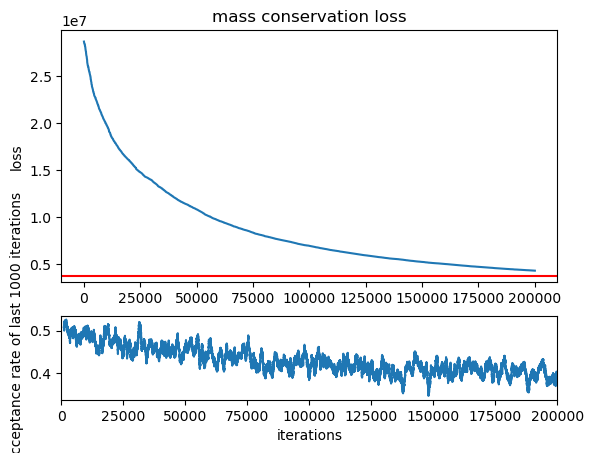

In [563]:
fig = geomc.plot_loss(np.array([mc_loss_1]), np.array([step_1]), loss_mc_bm, has_dataloss = False)

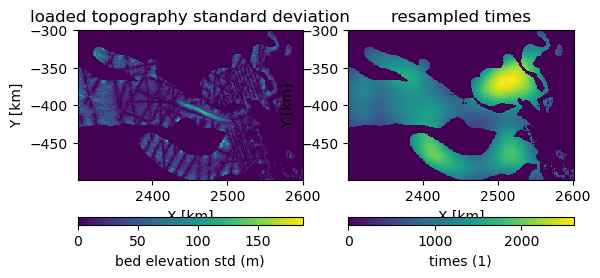

In [564]:
fig = geomc.plot_sample(loaded_bed_1[28*10:], resampled_times_1[28:], xx, yy)

(2300500.0, 2600500.0, -499500.0, -299500.0)

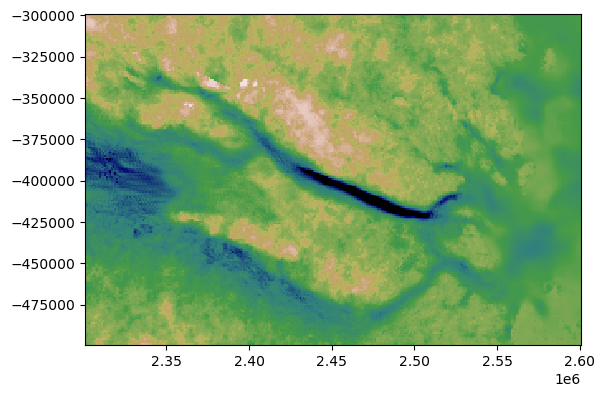

In [578]:
plt.pcolormesh(xx,yy,loaded_bed_1[-1],vmax=2000,vmin=-2500,cmap='gist_earth')
plt.axis('scaled')

In [566]:
loss_mc_bm = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = True, high_vel_mask = mask_final)
loss_mc_bm

3664671.392865846

In [567]:
mc_res = geomc.calc_mass_conservation(loaded_bed_1[-1], surf, velx, vely, dhdt, smb)
loss_mc_chain_in = geomc.loss_mc(mc_res, 'sumsq', inside_high_vel_region = True, high_vel_mask = mc_region_mask)
loss_mc_chain_all = geomc.loss_mc(mc_res, 'sumsq', inside_high_vel_region = False)
loss_mc_bm_in = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = True, high_vel_mask = mc_region_mask)
loss_mc_bm_all = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = False)

print('for the mc region sumsq loss, the end topo is', loss_mc_chain_in,'the bm is', loss_mc_bm_in)
print('for the global sumsq loss, the end topo is', loss_mc_chain_all,'the bm is', loss_mc_bm_all)

for the mc region sumsq loss, the end topo is 4269609.5892559625 the bm is 3664671.392865846
for the global sumsq loss, the end topo is 6038620.776613354 the bm is 6143698.106953391


(2300500.0, 2600500.0, -499500.0, -299500.0)

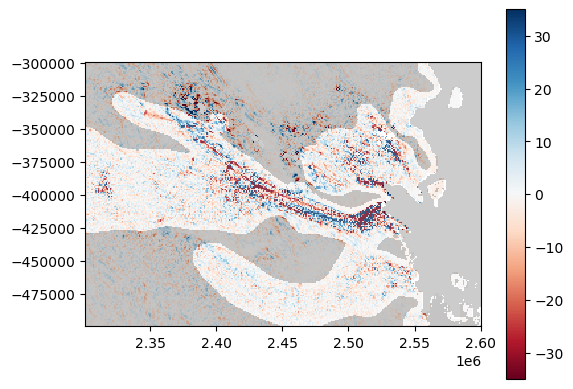

In [600]:
plt.pcolormesh(xx,yy,mc_res,vmax=35,vmin=-35,cmap='RdBu')
plt.colorbar()
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

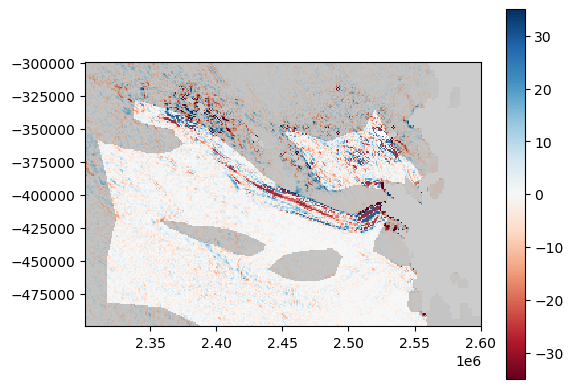

In [570]:
plt.pcolormesh(xx,yy,mc_res_bm,vmax=35,vmin=-35,cmap='RdBu')
plt.colorbar()
plt.pcolormesh(xx,yy,df_bm['source'].values.reshape(xx.shape)==2,cmap='grey',alpha=0.2)
plt.axis('scaled')

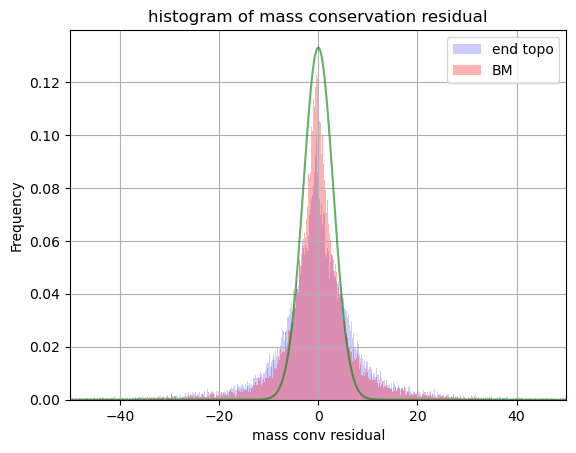

In [571]:
sigma3 = 3
sigma4 = 3.8
xl3=np.linspace(-100, 100, num=1000)
gaussian_model=1/(sigma3*np.sqrt(2*np.pi))*np.exp(-0.5*np.square(xl3/sigma3))
laplacian_model=1/(2*sigma4)*np.exp(-1*np.abs(xl3)/sigma4)

mc_res_bm_sr2 = mc_res_bm[mask_final==1]
mc_res_bm_sr2_f = mc_res_bm_sr2.flatten()
mc_res_bm_sr2_f = mc_res_bm_sr2_f[~np.isnan(mc_res_bm_sr2_f)]
mc_res_sr2 = mc_res[mask_final==1]
mc_res_sr2_f = mc_res_sr2.flatten()
mc_res_sr2_f = mc_res_sr2_f[~np.isnan(mc_res_sr2_f)]
bins=np.histogram(np.hstack((mc_res_sr2_f,mc_res_bm_sr2_f)), bins=5000)[1] #get the bin edges

plt.hist(mc_res_sr2_f, bins=bins, facecolor='blue', alpha=0.2,density=True,label='end topo')
plt.hist(mc_res_bm_sr2_f, bins=bins, facecolor='red', alpha=0.3,density=True,label='BM')
plt.plot(xl3, gaussian_model, color='Green',alpha=0.6)
#plt.plot(xl3, laplacian_model, color='Orange',alpha=0.6)
plt.xlim([-50,50]);
#plt.ylim([0,0.04])
plt.legend()
plt.xlabel('mass conv residual');
plt.ylabel('Frequency');
plt.title('histogram of mass conservation residual')
plt.grid(True)
plt.show()

(2300500.0, 2600500.0, -499500.0, -299500.0)

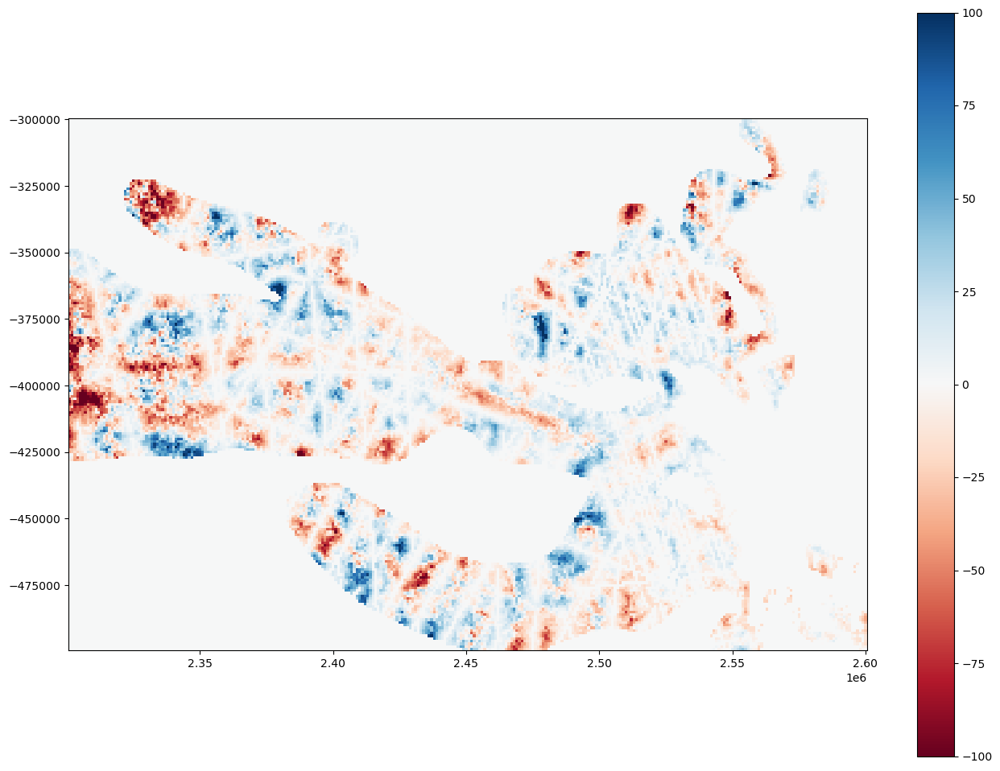

In [574]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,loaded_bed_1[-1]-loaded_bed_1[-10],cmap='RdBu',vmax=100,vmin=-100)
plt.colorbar()
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

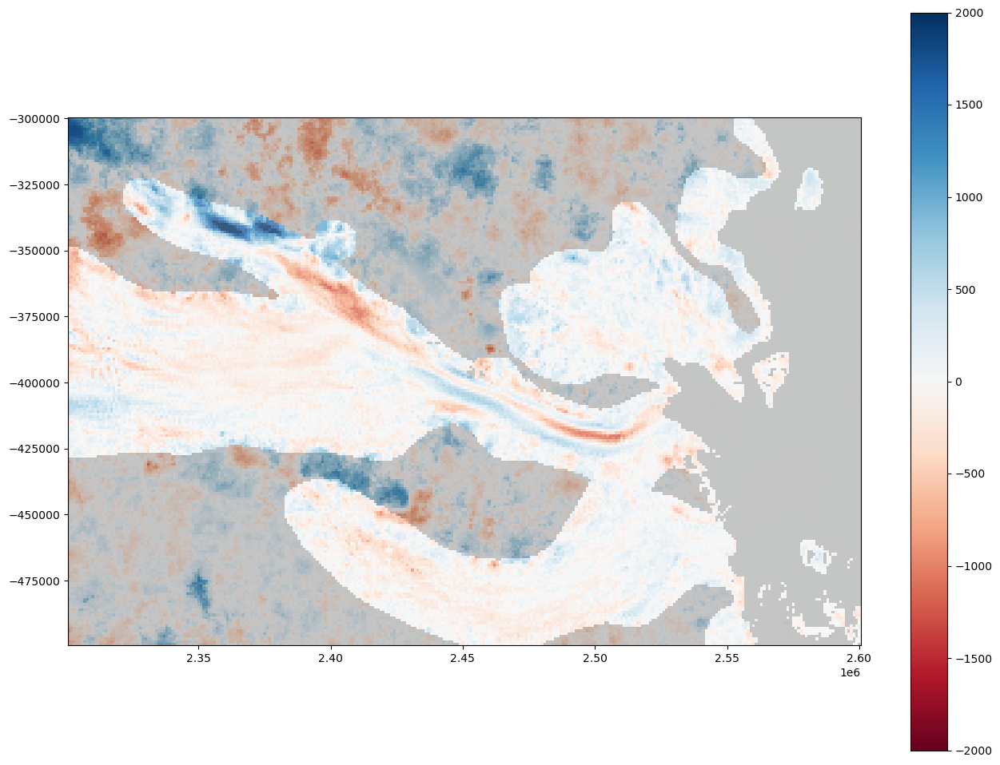

In [583]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,loaded_bed_1[-1]-df_bm.bed.values.reshape(xx.shape),cmap='RdBu',vmax=2000,vmin=-2000)
plt.colorbar()
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.axis('scaled')

In [614]:
bed_filtered1 = sp.ndimage.gaussian_filter(loaded_bed_1[-10], sigma=2)
bed_filtered2 = sp.ndimage.gaussian_filter(loaded_bed_1[-30], sigma=2)

(2300500.0, 2600500.0, -499500.0, -299500.0)

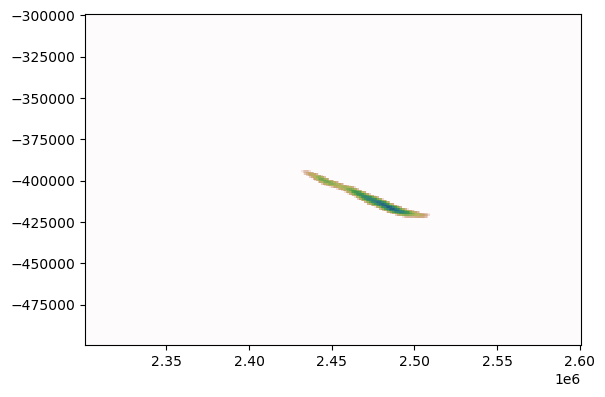

In [618]:
plt.pcolormesh(xx,yy,bed_filtered1,vmax=2000,vmin=-2500,cmap='gist_earth')
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

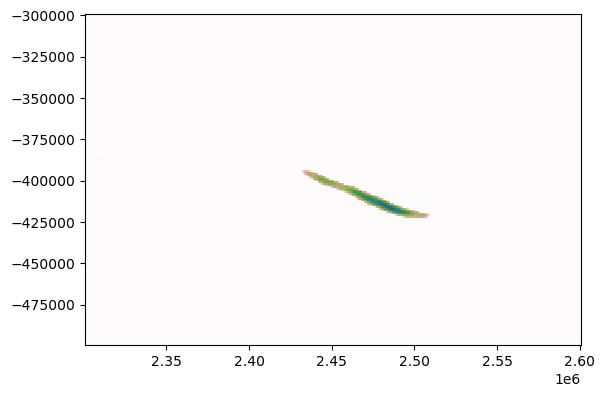

In [619]:
plt.pcolormesh(xx,yy,bed_filtered2,vmax=2000,vmin=-2500,cmap='gist_earth')
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

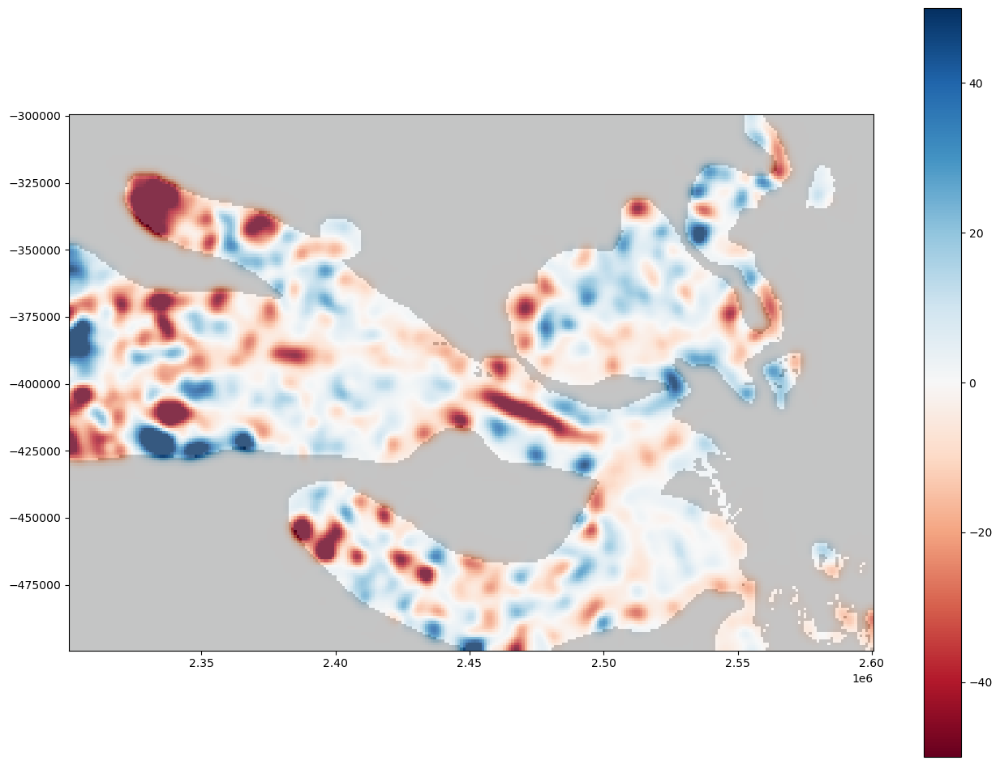

In [613]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,bed_filtered1-bed_filtered2,cmap='RdBu',vmax=50,vmin=-50)
plt.colorbar()
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

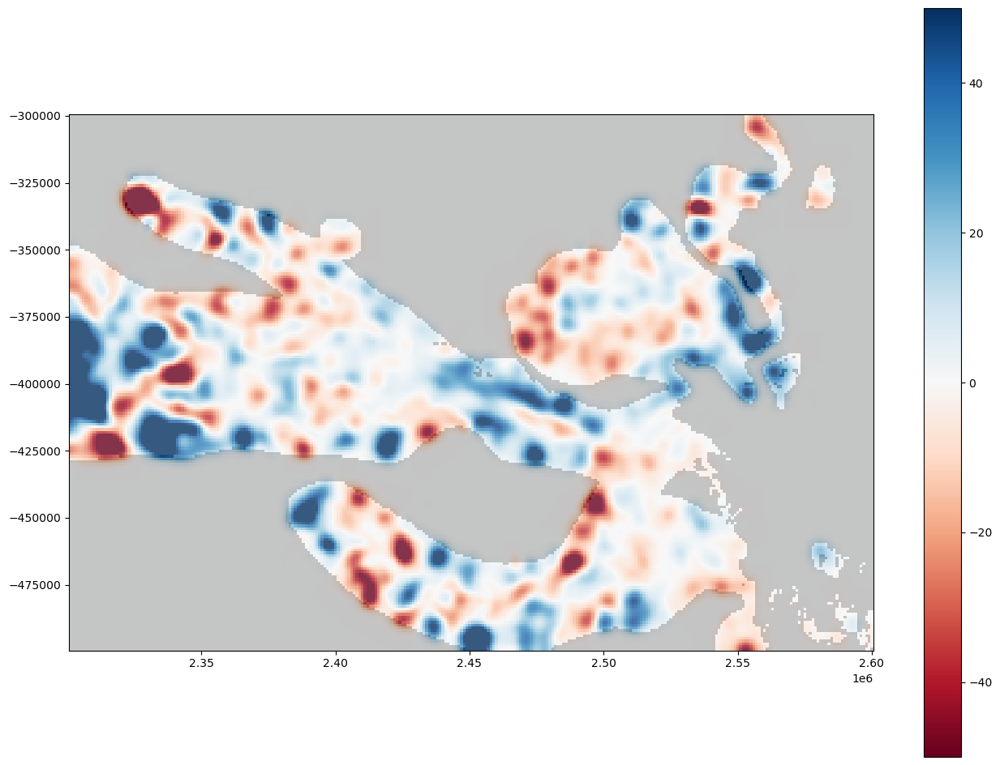

In [617]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,bed_filtered1-bed_filtered2,cmap='RdBu',vmax=50,vmin=-50)
plt.colorbar()
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

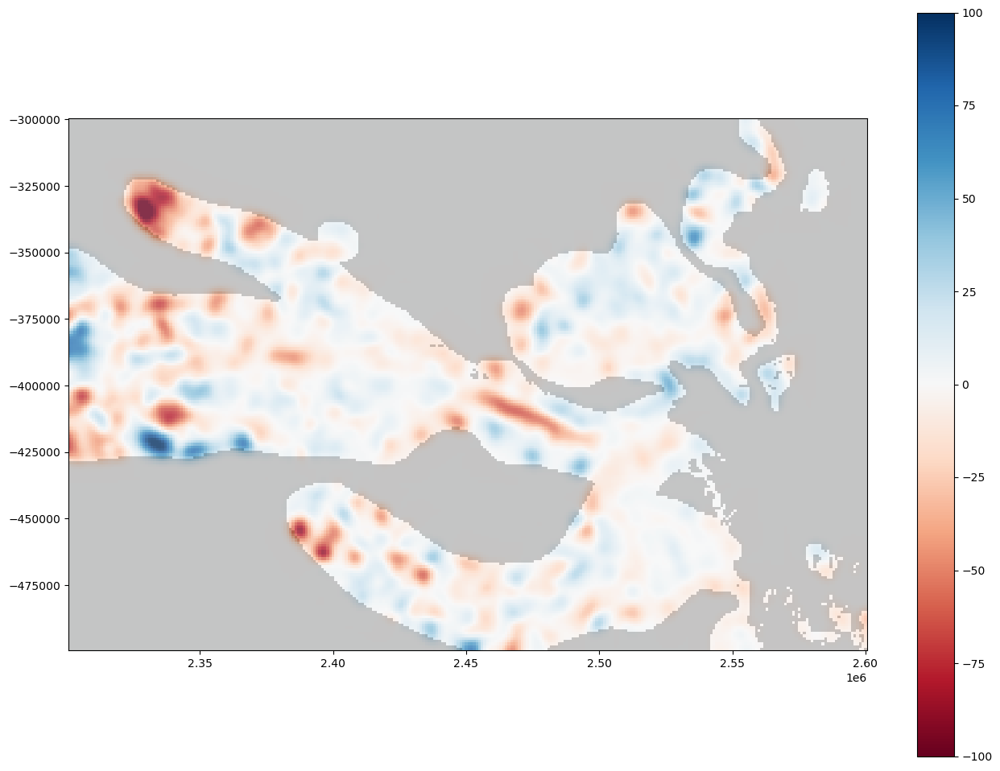

In [612]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,bed_filtered1-bed_filtered2,cmap='RdBu',vmax=100,vmin=-100)
plt.colorbar()
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

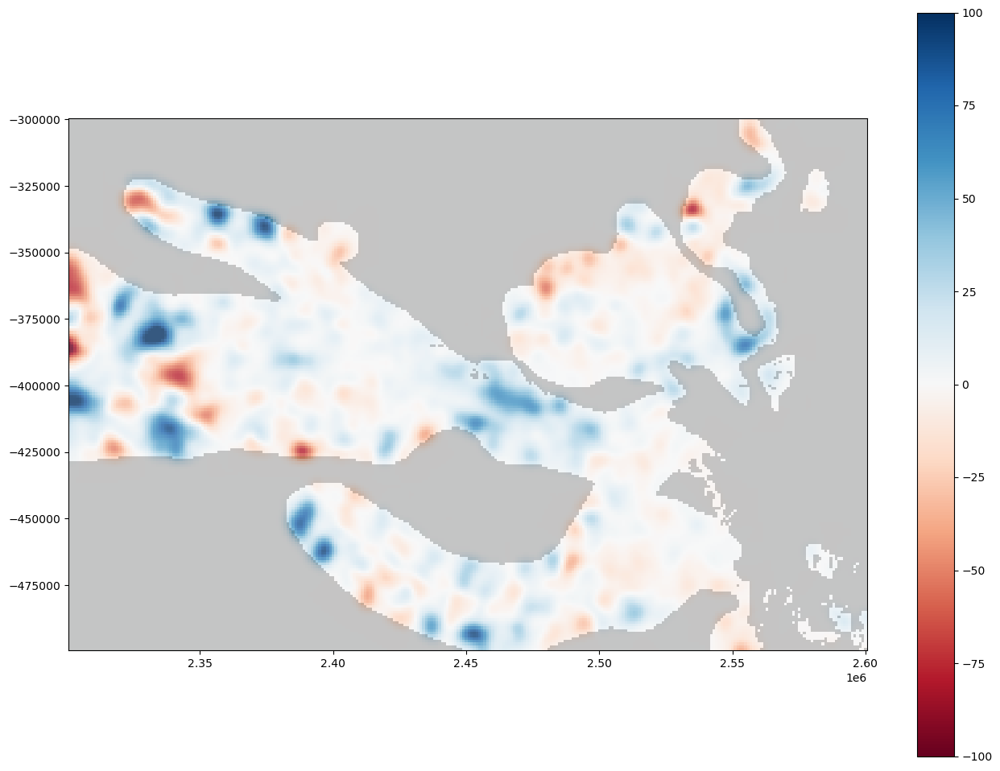

In [598]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,bed_filtered1-bed_filtered2,cmap='RdBu',vmax=100,vmin=-100)
plt.colorbar()
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.axis('scaled')

#### filter bed

In [626]:
avg_beds = np.loadtxt("./bed_cache_"+"38_3_41foravg"+".txt")
avg_beds = avg_beds.reshape(np.round(avg_beds.size/(rows*cols)).astype(int), rows, cols)
avg_bed = np.mean(avg_beds, axis=0)
bed_avged_filtered = sp.ndimage.gaussian_filter(avg_bed, sigma=2)

(2300500.0, 2600500.0, -499500.0, -299500.0)

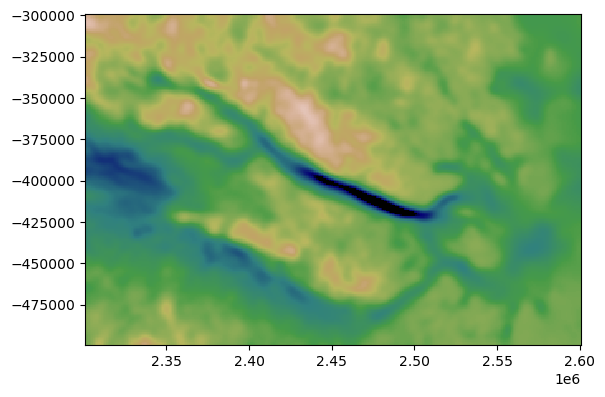

In [627]:
plt.pcolormesh(xx,yy,bed_avged_filtered,vmax=2000,vmin=-2500,cmap='gist_earth')
plt.axis('scaled')

In [628]:
np.savetxt('trend_38_3.txt',bed_avged_filtered)

## SGS

In [5]:
df = pd.read_csv('./compiled_Denman_QC_38_1_shallow.csv')
df=df.rename(columns={"bed": "bed_notpreprocessed"})
df=df.rename(columns={"bedQCrf": "bed"})

x_uniq = np.unique(df.X)
y_uniq = np.unique(df.Y)

xmin = np.min(x_uniq)
xmax = np.max(x_uniq)
ymin = np.min(y_uniq)
ymax = np.max(y_uniq)

cols = len(x_uniq)
rows = len(y_uniq)

resolution = 1000

xx, yy = np.meshgrid(x_uniq, y_uniq)
xx.shape

(200, 300)

In [6]:
## calculate resiudal
trend = np.loadtxt('trend_38_3.txt')
df['residual']=df['bed'].values-trend.flatten()
print(np.max(df.residual),np.mean(df.residual),np.std(df.residual),np.min(df.residual))

944.9905631690257 -5.459614973903767 97.64681767585138 -864.2147488058893


1.32549273167603 1.3202704 0.18121015647151228 0.20660445


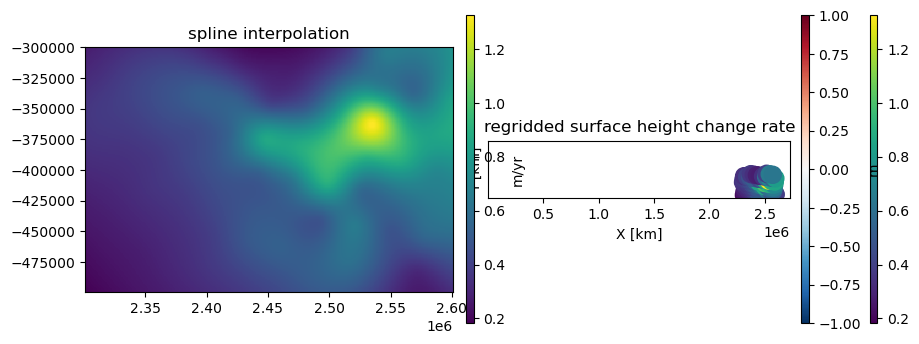

In [7]:
smb, fig1 = geomc.load_smb('./Data/SMB_RACMO2.3p2_yearly_ANT27_1979_2016.nc',xx,yy)
dhdt, fig2 = geomc.load_dhdt('./Data/ANT_G1920_GroundedIceHeight_v01.nc',xx,yy)
surf = df.surface.values.reshape((rows,cols))
velx = df.vel_x.values.reshape((rows,cols))
vely = df.vel_y.values.reshape((rows,cols))

data_index = df[df["bed"].isnull() == False].index
mask_index = df[df["mask"]==1].index

range, sill, and nugget for gaussian variogram is  [3978.6646829035744, 1.5787630112083733, 0]
for exponential variogram is  [5413.936735350018, 1.634491576061602, 0]
for spherical variogram is  [4547.163671124821, 1.585033212132834, 0]


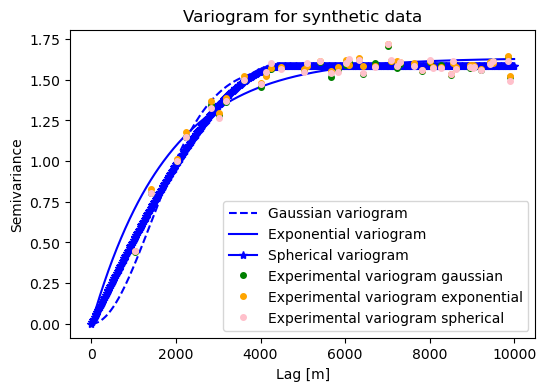

In [44]:
df_bed = df.copy()
df_bed = df_bed[df_bed["residual"].isnull() == False]
data = df_bed['residual'].values.reshape(-1,1)
coords = df_bed[['X','Y']].values
roughness_region_mask = (df_bed['bedmachine_mask'].values)==2

nst_trans, Nbed_detrend, fig = geomc.fit_variogram(data, coords, roughness_region_mask, maxlag=10000, n_lags=500, samples=0.9)

In [45]:
# save variogram parameters as a list
# vario1_radar = [azimuth, nugget, major_range, minor_range, sill, vtype]
vario1_detrend = [0, 0, 4547.163671124821, 4547.163671124821, 1.585033212132834, 'Spherical']

In [46]:
df_bed['Nbed_detrend'] = Nbed_detrend.flatten()

In [48]:
k = 48
rad = 50000

Pred_grid_xy = gs.Gridding.prediction_grid(xmin, xmax, ymin, ymax, resolution)
x = np.reshape(Pred_grid_xy[:,0], (rows*cols, 1))
y = np.flip(np.reshape(Pred_grid_xy[:,1], (rows*cols, 1))) # need to flip y otherwise the coordinate does not match
Pred_grid_xy = np.concatenate((x,y),axis=1)

sim = gs.Interpolation.okrige_sgs(Pred_grid_xy, df_bed, 'X', 'Y', 'Nbed_detrend', k, vario1_detrend, rad)

# convert the first SGS matrix to a dataframe
x = np.reshape(Pred_grid_xy[:,0], (rows*cols, 1))
y = np.reshape(Pred_grid_xy[:,1], (rows*cols, 1))
xy_grid = np.concatenate((x,y,sim.flatten().reshape(-1,1)),axis=1)
psimdf = pd.DataFrame(data = xy_grid,columns=['X','Y','Z'],index=df.index)

sgs_bed = nst_trans.inverse_transform(np.array(psimdf['Z']).reshape(-1,1)).reshape(rows,cols)
np.savetxt('sgs_bed_38_4.txt',sgs_bed)

100%|██████████| 60000/60000 [06:11<00:00, 161.65it/s]


In [198]:
sgs_bed = np.loadtxt('sgs_bed_38_4.txt')

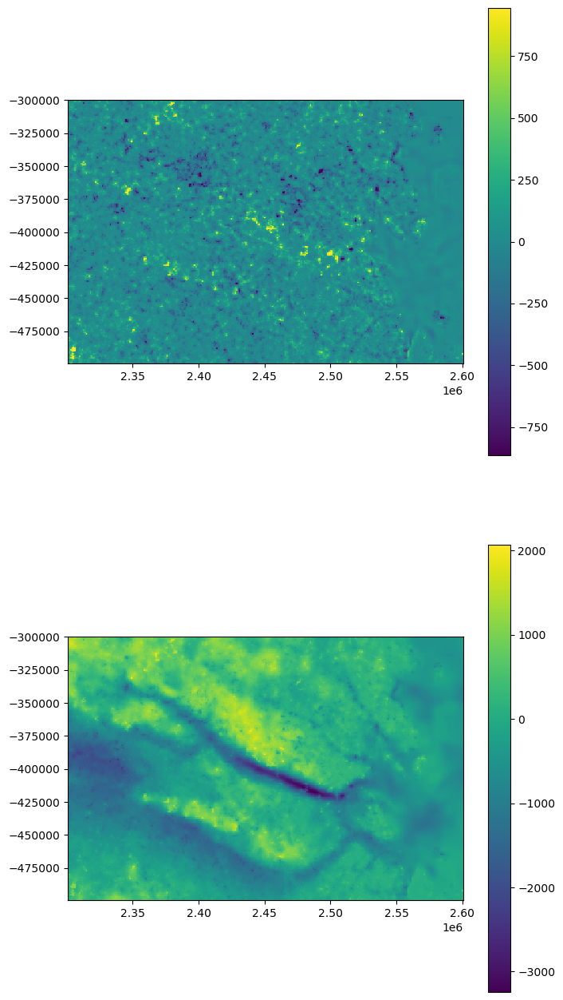

In [201]:
plt.figure(figsize=(8,16))

plt.subplot(2,1,1)
plt.pcolormesh(xx,yy,sgs_bed)
plt.axis('scaled')
plt.colorbar()

plt.subplot(2,1,2)
plt.pcolormesh(xx,yy,sgs_bed + trend)
plt.axis('scaled')
plt.colorbar()

In [55]:
cond_bed = df.bed.values.reshape((rows,cols))
cond_data_mask = ~np.isnan(cond_bed)

In [59]:
df_bm = pd.read_csv('./Data/Aurora_bedmachine_data.csv')
df_bm = df_bm[(df_bm['x']>=xmin) & (df_bm['x']<=xmax) & (df_bm['y']>=ymin) & (df_bm['y']<=ymax)].copy()
df_bm = df_bm.reset_index()
mc_res_bm = geomc.calc_mass_conservation(df_bm.bed.values.reshape(rows,cols), surf, velx, vely, dhdt, smb)

In [65]:
mc_region_mask = df['mask'].values.reshape(xx.shape)

In [165]:
loaded_bed_temp = np.loadtxt("bed_cache"+'_38_3_40'+".txt")
loaded_bed_temp = loaded_bed_temp.reshape(np.round(loaded_bed_temp.size/(rows*cols)).astype(int), rows, cols)

In [166]:
res_bed = loaded_bed_temp[-1] - trend
norm_res_bed = nst_trans.transform(res_bed.reshape(-1,1)).reshape(rows,cols)
x = np.reshape(Pred_grid_xy[:,0], (rows*cols, 1))
y = np.reshape(Pred_grid_xy[:,1], (rows*cols, 1))
xy_grid = np.concatenate((x,y,norm_res_bed.flatten().reshape(-1,1)),axis=1)
psimdf = pd.DataFrame(data = xy_grid,columns=['X','Y','Z'],index=df.index)

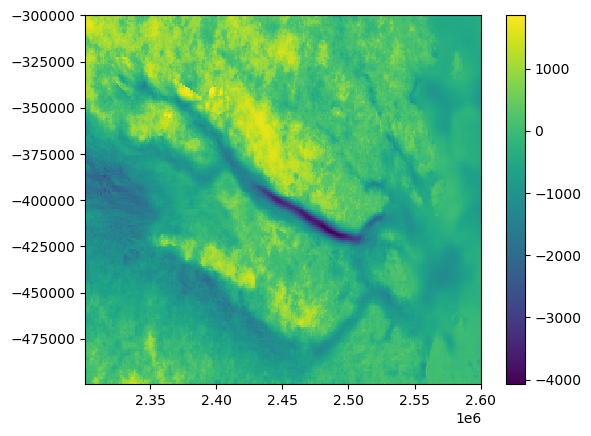

In [167]:
testbed = nst_trans.inverse_transform(np.array(psimdf['Z']).reshape(-1,1)).reshape(rows,cols) + trend
plt.pcolormesh(xx,yy,testbed)
plt.colorbar()

In [168]:
#start with end bed of crf chain

n_iter_list = [10000]*30
block_size_list = [((2,2),(8,8))]*30
file_postfix_list = ['_38_4_'+str(i) for i in range(1,31)]
choice_param_list = [500] * 30
sigma_mc_list = [3]*30

resolution = 1000
mc_loss_type = 'sumsq'
sigma_mc = 3
mcloss_in_high_vel = True
searching_radius = 20000
num_nearest_neighbors = 48
rand_dropout = False
dropoutrate = -1

In [ ]:
#start crf in stages for easier storage
for i in range(0,len(n_iter_list)):
    n_iter = n_iter_list[i]
    file_postfix = file_postfix_list[i]
    choice_param = choice_param_list[i]

    sigma_mc = sigma_mc_list[i]
    block_size = block_size_list[i]
    
    bed_cache, loss_mc_cache, loss_cache, step_cache, resampled_times, blocks_cache = geomc.sgs_chain(psimdf,'X', 'Y', 'Z', 
          nst_trans, trend, resolution, vario1_detrend,
          cond_data_mask, mc_region_mask,
          surf, velx, vely, dhdt, smb,
          n_iter, block_size, 
          mc_loss_type, sigma_mc, mcloss_in_high_vel,
          searching_radius, num_nearest_neighbors,
          rand_dropout, dropoutrate)
    
    res_bed = bed_cache[-1] - trend
    norm_res_bed = nst_trans.transform(res_bed.reshape(-1,1)).reshape(rows,cols)
    x = np.reshape(Pred_grid_xy[:,0], (rows*cols, 1))
    y = np.reshape(Pred_grid_xy[:,1], (rows*cols, 1))
    xy_grid = np.concatenate((x,y,norm_res_bed.flatten().reshape(-1,1)),axis=1)
    psimdf = pd.DataFrame(data = xy_grid,columns=['X','Y','Z'],index=df.index)

    if choice_param == 1: # save all data
        np.savetxt("bed_cache"+file_postfix+".txt", bed_cache[:n_iter,:,:].reshape(n_iter, -1))
    else: # save a topo per choice_param topo
        choice = np.round(np.linspace(0, n_iter-1, num=int(n_iter/choice_param))).astype(int)
        np.savetxt("bed_cache"+file_postfix+".txt", bed_cache[choice,:,:].reshape(len(choice), -1))

    np.savetxt("loss_cache"+file_postfix+".txt",loss_cache[:n_iter])
    np.savetxt("loss_mc_cache"+file_postfix+".txt",loss_mc_cache[:n_iter])
    #np.savetxt("loss_data_cache"+file_postfix+".txt",loss_data_cache[:n_iter])
    #np.savetxt("loss_data_in_cache"+file_postfix+".txt",loss_data_in_cache[:n_iter])
    #np.savetxt("loss_data_out_cache"+file_postfix+".txt",loss_data_out_cache[:n_iter])
    np.savetxt("step_cache"+file_postfix+".txt",step_cache[:n_iter])
    np.savetxt("resampled_times"+file_postfix+".txt",resampled_times)
    np.savetxt("blocks_cache"+file_postfix+".txt",blocks_cache)

i: 0 loss: 2.381e+05 acceptance rate: 0.0
i: 100 loss: 2.376e+05 acceptance rate: 0.4752475247524752
i: 200 loss: 2.367e+05 acceptance rate: 0.4427860696517413
i: 300 loss: 2.364e+05 acceptance rate: 0.3920265780730897
i: 400 loss: 2.360e+05 acceptance rate: 0.38154613466334164
i: 500 loss: 2.303e+05 acceptance rate: 0.3932135728542914
i: 600 loss: 2.300e+05 acceptance rate: 0.3910149750415973
i: 700 loss: 2.297e+05 acceptance rate: 0.39372325249643364
i: 800 loss: 2.291e+05 acceptance rate: 0.39325842696629215
i: 900 loss: 2.288e+05 acceptance rate: 0.38290788013318533
i: 1000 loss: 2.283e+05 acceptance rate: 0.3836163836163836
i: 1100 loss: 2.280e+05 acceptance rate: 0.3760217983651226
i: 1200 loss: 2.277e+05 acceptance rate: 0.37801831806827646


In [170]:
n_iter_list_1 =  [10000] * 12
file_postfix_list_1 = ['_38_4_'+str(i) for i in range(1,13)]
choice_param_list_1 = [500] * 12

In [171]:
mc_loss_1 = np.zeros(np.sum(n_iter_list_1))
#data_loss_1 = np.zeros(np.sum(n_iter_list_1))
step_1 = np.zeros(np.sum(n_iter_list_1))
blocks_1 = np.zeros((np.sum(n_iter_list_1),4))
for i in range(len(n_iter_list_1)):
    file_postfix = file_postfix_list_1[i]
    mc_loss_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./loss_mc_cache"+file_postfix+".txt")
    #data_loss_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./loss_data_cache"+file_postfix+".txt")
    step_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./step_cache"+file_postfix+".txt")
    blocks_1[int(np.sum(n_iter_list_1[:i])):int(np.sum(n_iter_list_1[:i+1]))] = np.loadtxt("./blocks_cache"+file_postfix+".txt")

In [172]:
# load file
nsil = np.floor(np.divide(n_iter_list_1, choice_param_list_1)).astype(int)
loaded_bed_1 = np.zeros((np.sum(nsil), rows, cols))
resampled_times_1 = np.zeros((len(n_iter_list_1), rows, cols))
for i in range(len(nsil)):
    file_postfix = file_postfix_list_1[i]
    loaded_bed_temp = np.loadtxt("./bed_cache"+file_postfix+".txt")
    loaded_bed_temp = loaded_bed_temp.reshape(np.round(loaded_bed_temp.size/(rows*cols)).astype(int), rows, cols)
    loaded_bed_1[int(np.sum(nsil[:i])):int(np.sum(nsil[:i+1])),:,:] = loaded_bed_temp
    resampled_times_1[i,:,:] = np.loadtxt("./resampled_times"+file_postfix+".txt").reshape(rows, cols)
    
mse_loss_1 = np.zeros(np.sum(nsil))
for i in range(loaded_bed_1.shape[0]):
    mc_res_now = geomc.calc_mass_conservation(loaded_bed_1[i], surf, velx, vely, dhdt, smb)
    mse_loss_1[i] = geomc.loss_mc(mc_res_now, 'sumabs', inside_high_vel_region = False)

(2300500.0, 2600500.0, -499500.0, -299500.0)

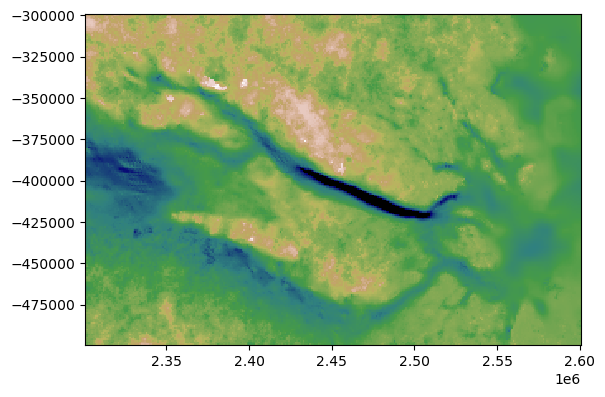

In [173]:
plt.pcolormesh(xx,yy,loaded_bed_1[-1],vmax=2000,vmin=-2500,cmap='gist_earth')
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

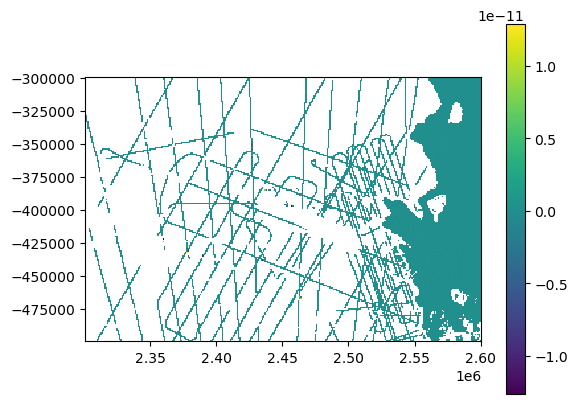

In [174]:
plt.pcolormesh(xx,yy,loaded_bed_1[-1]-cond_bed)
plt.colorbar()
plt.axis('scaled')

In [175]:
loss_mc_bm = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = True, high_vel_mask = mc_region_mask)
loss_mc_bm

3664671.392865846

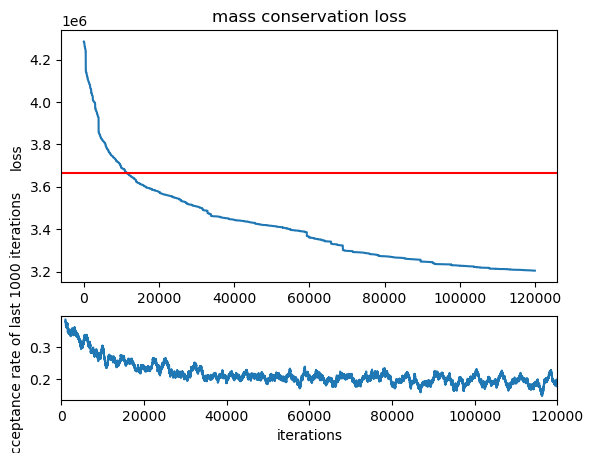

In [193]:
fig = geomc.plot_loss(np.array([mc_loss_1]), np.array([step_1]), loss_mc_bm, has_dataloss = False)

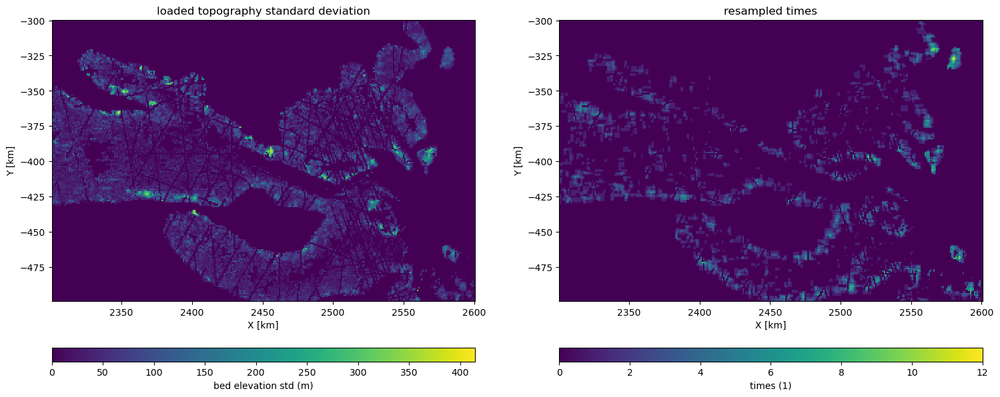

In [182]:
fig = geomc.plot_sample(loaded_bed_1, np.array([resampled_times[:]]), xx, yy)

In [183]:
mc_res = geomc.calc_mass_conservation(loaded_bed_1[-1], surf, velx, vely, dhdt, smb)
loss_mc_chain_in = geomc.loss_mc(mc_res, 'sumsq', inside_high_vel_region = True, high_vel_mask = mc_region_mask)
loss_mc_chain_all = geomc.loss_mc(mc_res, 'sumsq', inside_high_vel_region = False)
loss_mc_bm_in = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = True, high_vel_mask = mc_region_mask)
loss_mc_bm_all = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = False)

print('for the mc region sumsq loss, the end topo is', loss_mc_chain_in,'the bm is', loss_mc_bm_in)
print('for the global sumsq loss, the end topo is', loss_mc_chain_all,'the bm is', loss_mc_bm_all)

for the mc region sumsq loss, the end topo is 3204076.8837299813 the bm is 3664671.392865846
for the global sumsq loss, the end topo is 4950705.268616241 the bm is 6143698.106953391


(2300500.0, 2600500.0, -499500.0, -299500.0)

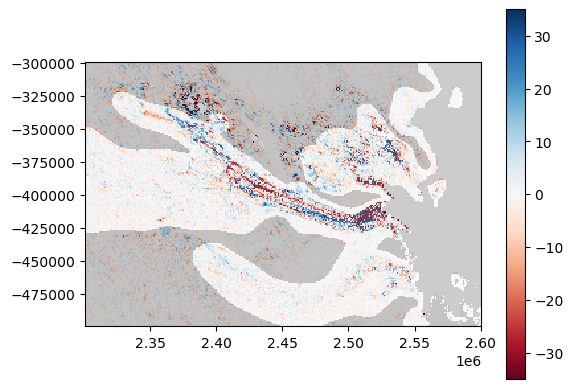

In [196]:
plt.pcolormesh(xx,yy,mc_res,vmax=35,vmin=-35,cmap='RdBu')
plt.colorbar()
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

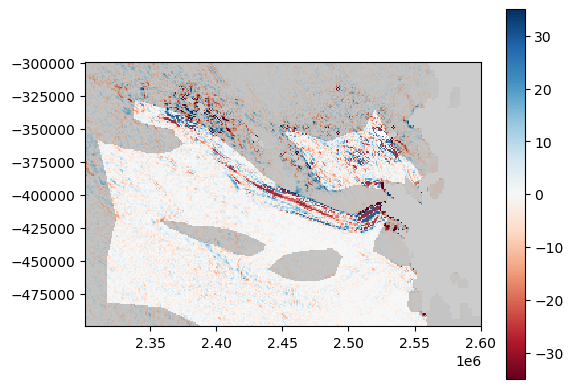

In [197]:
plt.pcolormesh(xx,yy,mc_res_bm,vmax=35,vmin=-35,cmap='RdBu')
plt.colorbar()
plt.pcolormesh(xx,yy,df_bm['source'].values.reshape(xx.shape)==2,cmap='grey',alpha=0.2)
plt.axis('scaled')

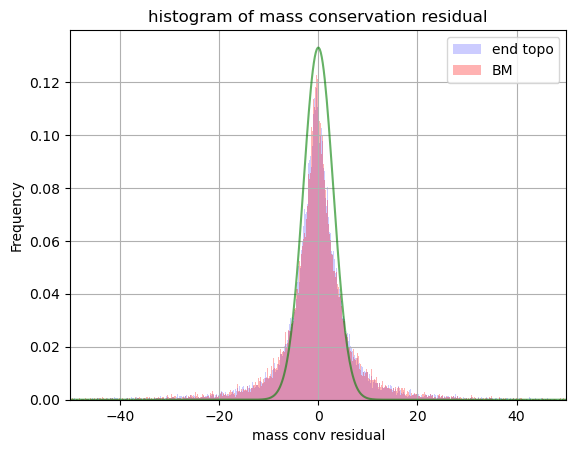

In [188]:
sigma3 = 3
sigma4 = 3.8
xl3=np.linspace(-100, 100, num=1000)
gaussian_model=1/(sigma3*np.sqrt(2*np.pi))*np.exp(-0.5*np.square(xl3/sigma3))
laplacian_model=1/(2*sigma4)*np.exp(-1*np.abs(xl3)/sigma4)

mc_res_bm_sr2 = mc_res_bm[mc_region_mask==1]
mc_res_bm_sr2_f = mc_res_bm_sr2.flatten()
mc_res_bm_sr2_f = mc_res_bm_sr2_f[~np.isnan(mc_res_bm_sr2_f)]
mc_res_sr2 = mc_res[mc_region_mask==1]
mc_res_sr2_f = mc_res_sr2.flatten()
mc_res_sr2_f = mc_res_sr2_f[~np.isnan(mc_res_sr2_f)]
bins=np.histogram(np.hstack((mc_res_sr2_f,mc_res_bm_sr2_f)), bins=5000)[1] #get the bin edges

plt.hist(mc_res_sr2_f, bins=bins, facecolor='blue', alpha=0.2,density=True,label='end topo')
plt.hist(mc_res_bm_sr2_f, bins=bins, facecolor='red', alpha=0.3,density=True,label='BM')
plt.plot(xl3, gaussian_model, color='Green',alpha=0.6)
#plt.plot(xl3, laplacian_model, color='Orange',alpha=0.6)
plt.xlim([-50,50]);
#plt.ylim([0,0.04])
plt.legend()
plt.xlabel('mass conv residual');
plt.ylabel('Frequency');
plt.title('histogram of mass conservation residual')
plt.grid(True)
plt.show()

(2300500.0, 2600500.0, -499500.0, -299500.0)

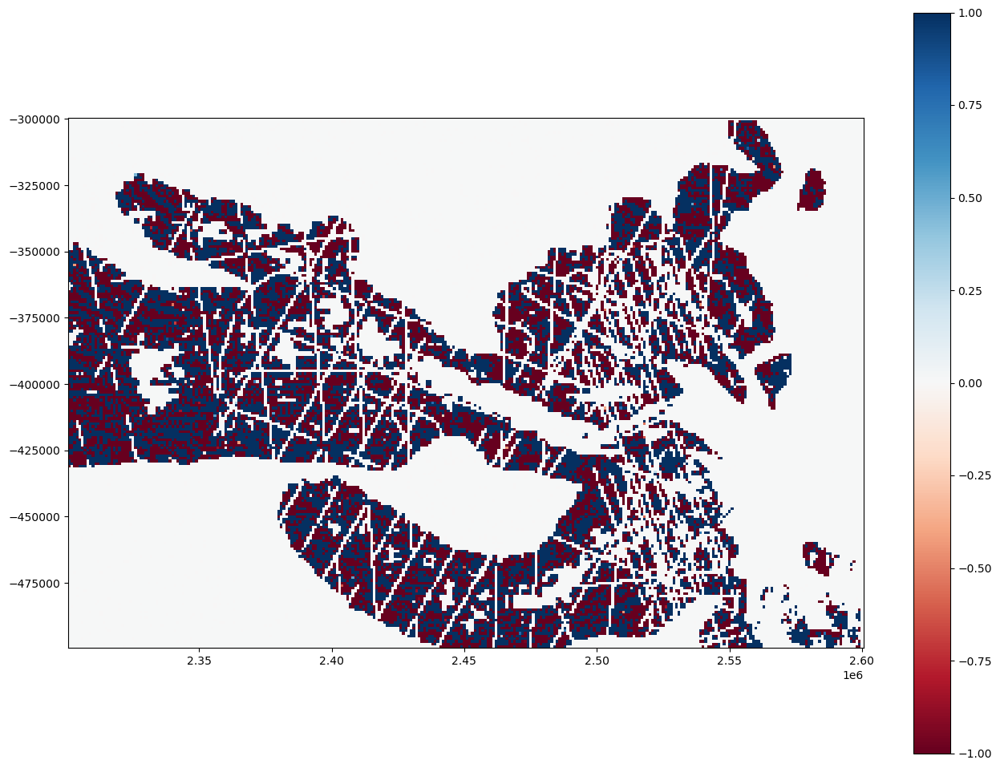

In [191]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,loaded_bed_1[-1]-loaded_bed_1[0],cmap='RdBu',vmax=1,vmin=-1)
plt.colorbar()
plt.axis('scaled')

(2300500.0, 2600500.0, -499500.0, -299500.0)

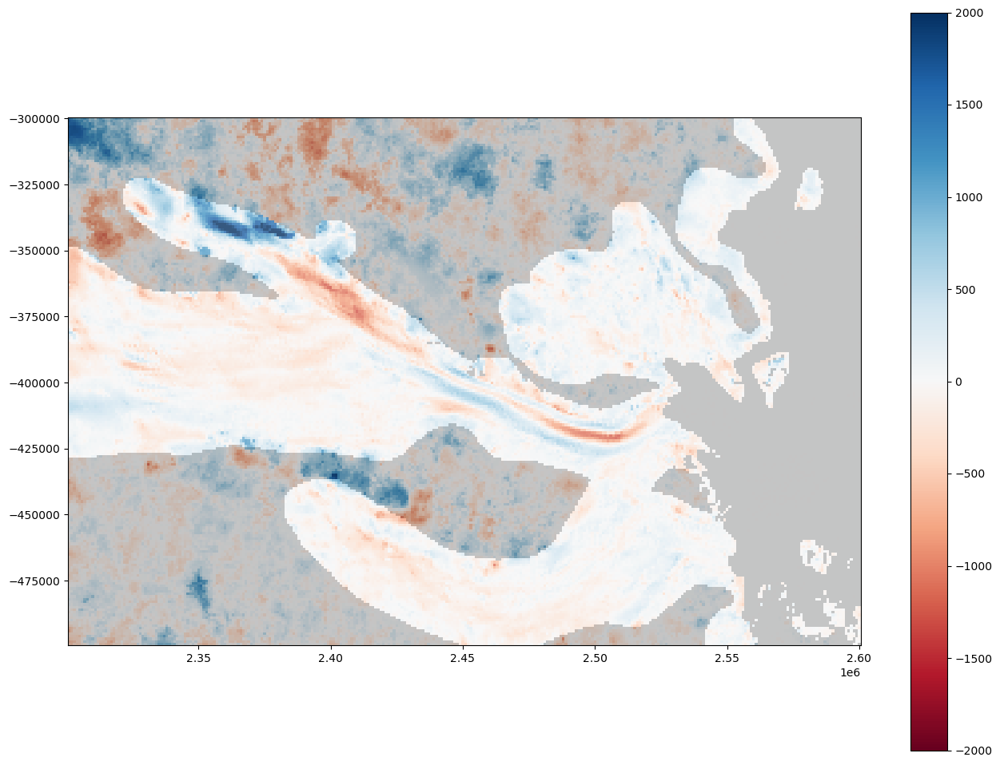

In [192]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,loaded_bed_1[-1]-df_bm.bed.values.reshape(xx.shape),cmap='RdBu',vmax=2000,vmin=-2000)
plt.colorbar()
plt.pcolormesh(xx,yy,mc_region_mask,cmap='grey',alpha=0.2)
plt.axis('scaled')

In [105]:
df = pd.read_csv('./Data/compiled_Totten_QC_iceshelve_included_modeling.csv')

df=df.rename(columns={"bed": "bed_notpreprocessed"})
df=df.rename(columns={"bedQCrf": "bed"})

x_uniq = np.unique(df.X)
y_uniq = np.unique(df.Y)

xmin = np.min(x_uniq)
xmax = np.max(x_uniq)
ymin = np.min(y_uniq)
ymax = np.max(y_uniq)

cols = len(x_uniq)
rows = len(y_uniq)

resolution = 500

xx, yy = np.meshgrid(x_uniq, y_uniq)
xx.shape

(1400, 1000)

2.095562275095972 2.0808275 -0.2089699461853911 -1.1166306e-05


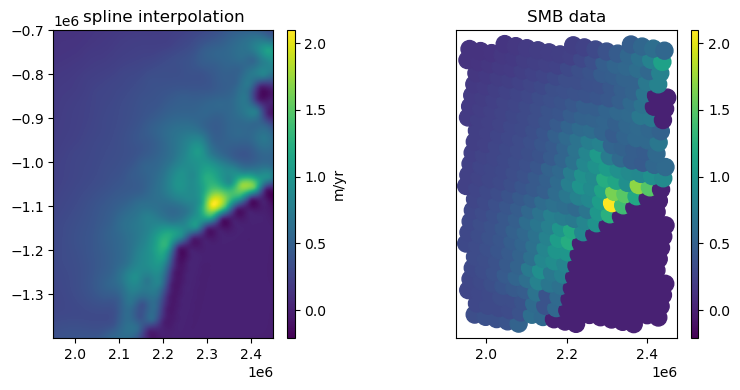

In [10]:
smb, fig = geomc.load_smb('./Data/SMB_RACMO2.3p2_yearly_ANT27_1979_2016.nc',xx,yy)

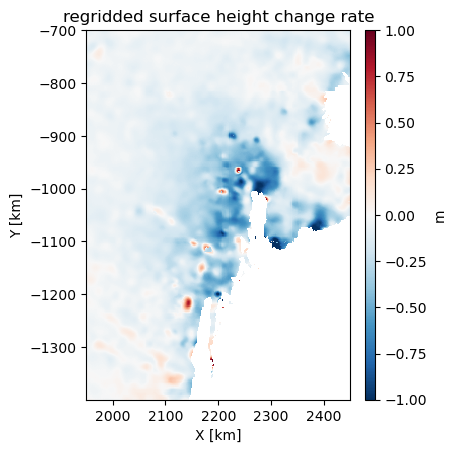

In [11]:
dhdt, fig = geomc.load_dhdt('./Data/ANT_G1920_GroundedIceHeight_v01.nc',xx,yy)

In [123]:
#initialize vars
surf = df.surface.values.reshape((rows,cols))
velx = df.vel_x.values.reshape((rows,cols))
vely = df.vel_y.values.reshape((rows,cols))

data_index = df[df["bed"].isnull() == False].index
mask_index = df[df["mask"]==1].index

In [110]:
df_bm = pd.read_csv('./Data/aurora_bedmachine_modeling.csv')
df_bm = df_bm[(df_bm['x']>=xmin) & (df_bm['x']<=xmax) & (df_bm['y']>=ymin) & (df_bm['y']<=ymax)].copy()
df_bm = df_bm.reset_index()
df_bm

,index,Unnamed: 0,x,y,mask,bed,surface,thickness,source,error
0,95370,95370,1950500.0,-1399500.0,2.0,36.206055,1810.766968,1774.560913,5.0,170.0
1,95371,95371,1951000.0,-1399500.0,2.0,32.509033,1805.958740,1773.449707,5.0,170.0
2,95372,95372,1951500.0,-1399500.0,2.0,33.630005,1806.262207,1772.632202,5.0,170.0
3,95373,95373,1952000.0,-1399500.0,2.0,37.375610,1809.461182,1772.085571,5.0,170.0
4,95374,95374,1952500.0,-1399500.0,2.0,39.454102,1811.223511,1771.769409,5.0,170.0
...,...,...,...,...,...,...,...,...,...,...
1399995,3560289,3560289,2448000.0,-700000.0,2.0,-239.257935,1315.447754,1554.705688,5.0,98.0
1399996,3560290,3560290,2448500.0,-700000.0,2.0,-218.960083,1316.921509,1535.881592,5.0,89.0
1399997,3560291,3560291,2449000.0,-700000.0,2.0,-194.447510,1320.638794,1515.086304,5.0,80.0
1399998,3560292,3560292,2449500.0,-700000.0,2.0,-166.733643,1323.869263,1490.602905,5.0,70.0


In [111]:
mc_region_mask = df['mask'].values.reshape(xx.shape)
mc_res_bm = geomc.calc_mass_conservation(df_bm.bed.values.reshape(rows,cols), surf, velx, vely, dhdt, smb)

In [17]:
range_max = [30e3, 30e3]
range_min = [10e3, 10e3]
step_range = [50,51]
nug_max = 0.0
logistic_param = [2,0,6,1]
max_dist = 20000

In [119]:
# dist = np.loadtxt('./output/dist.txt')

# iceshelf_mask = (df_bm['mask'].values.reshape((rows,cols))==3) | (df_bm['mask'].values.reshape((rows,cols))==1) | (df_bm['mask'].values.reshape((rows,cols))==0) 

# df_bed = df.copy()
# radarbed = df_bed['bed'].values.reshape(xx.shape)
# bmbed = df_bm['bed'].values.reshape(xx.shape)
# cond_bed = np.where(mc_region_mask,radarbed,bmbed)
# cond_bed = np.where(iceshelf_mask,radarbed,cond_bed)   

# df_bedxy = df.copy()
# df_bedxy['bed'] = cond_bed.flatten()
# df_bedxy = df_bedxy[df_bedxy['bed'].isnull()]
# sim_index = df_bedxy.index

# df['dist'] = 0.0
# df.loc[sim_index, 'dist'] = dist
# dist_matrix = df.dist.values.reshape(xx.shape)

#np.savetxt('./output/dist_matrix.txt',dist_matrix)

In [116]:
dist_matrix = np.loadtxt('./output/dist_matrix.txt')

In [117]:
dist_rescale = geomc.rescale(dist_matrix, max_dist)
dist_logi = geomc.logistic(dist_rescale, logistic_param[0], logistic_param[1], logistic_param[2]) - logistic_param[3]
weight = dist_logi - np.min(dist_logi)
field = geomc.generate_RF(x_uniq,y_uniq,step_range,nug_max,range_min,range_max,model_name='Exponential',isotropic=True)

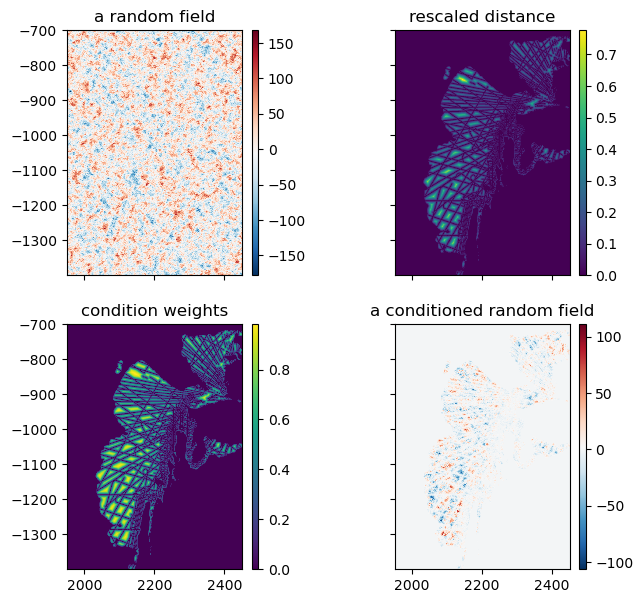

In [118]:
ds = [field,
      dist_rescale,
      weight,
      field * weight ]
titles = ['a random field', 'rescaled distance', 'condition weights', 'a conditioned random field']
cmaps = ['RdBu_r','viridis','viridis','RdBu_r']

fig, axs = plt.subplots(2, 2, figsize=(8.5,7), sharey=True, sharex=True,
                       gridspec_kw={'wspace':-0.01})

for ax, d, t, c in zip(axs.ravel(), ds, titles, cmaps):
    im = ax.pcolormesh(xx/1000, yy/1000, d, cmap=c)
    ax.set_title(t)
    ax.axis('scaled')
    plt.colorbar(im, ax=ax, pad=0.03, aspect=40)
plt.show()

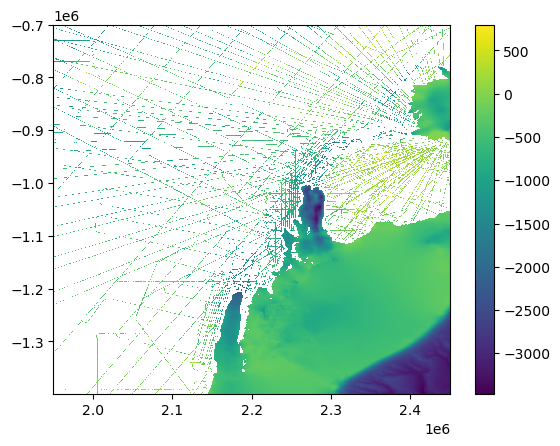

In [129]:
plt.pcolormesh(xx,yy,df['bed'].values.reshape(xx.shape))
plt.colorbar()

In [132]:
df_bed = df.copy()
df_bed['bed'] = cond_bed.flatten()
df_bed = df_bed[(~df_bed['bed'].isnull())]

data = cond_bed[~np.isnan(cond_bed)].reshape(-1,1)
nst_trans = QuantileTransformer(n_quantiles=500, output_distribution="normal",random_state=0).fit(data)
df_bed.loc[:,'Nbed_radar'] = nst_trans.transform(data)

In [120]:
# df_bed = df.copy()
# df_bed = df_bed[df_bed['bed'].isnull()==False]

# data = df_bed['bed'].values.reshape(-1,1)
# nst_trans = QuantileTransformer(n_quantiles=500, output_distribution="normal",random_state=0).fit(data)
# df_bed.loc[:,'Nbed_radar'] = nst_trans.transform(data)

In [134]:
sim = np.loadtxt('./output/aurora_sim_40_1.txt')

xy_grid = np.array([df.X.values.flatten(),df.Y.values.flatten(),df.bed.values.flatten()])
psimdf = pd.DataFrame(data = xy_grid.T,columns=['X','Y','Z'],index=df.index)
psimdf.loc[df_bed.index,'Z'] = df_bed.Nbed_radar.values
psimdf.loc[sim_index,'Z'] = sim

bed = nst_trans.inverse_transform(np.array(psimdf['Z']).reshape(-1,1)).reshape(rows,cols)

In [139]:
np.savetxt('./output/aurora_sim_40_1_aftertransform.txt',bed)

In [140]:
bed = np.loadtxt('./output/aurora_sim_40_1_aftertransform.txt')

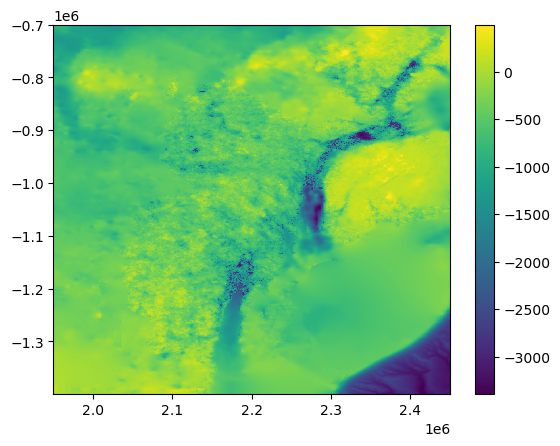

In [141]:
plt.pcolormesh(xx,yy,bed)
plt.colorbar()

In [ ]:
#find the start topography
loaded_bed_cache = np.loadtxt("bed_cache_40_3_1.txt")
bed_cache = loaded_bed_cache.reshape(np.round(loaded_bed_cache.size/(rows*cols)).astype(int), rows, cols)
bed = bed_cache[-1]

mc_res = calc_mass_conservation(bed, surf, velx, vely, dhdt, smb)
print('initial mc res is ', geomc.loss_mc(mc_res, 'sumsq', inside_high_vel_region = False))

In [1]:
#define parameters
n_iter_list =  [1000] * 1
sigma_mc_list = [3.2] * 1
sigma_data_list = [50] * 1
param_list = [[30e3, 10e3, [50,200], [(60,60),(140,140)]]] * 1
file_postfix_list = ['_40_3_'+str(i) for i in range(81,93)]
choice_param_list = [10] * 1

resolution = 500
covariance_type = 'Exponential'
logistic_param = [2,0,6,1]
isotropic = True
mc_loss_type = 'sumsq'
maxdist = 80000

In [ ]:
#start crf in stages for easier storage
for i in range(0,len(n_iter_list)):
    n_iter = n_iter_list[i]
    file_postfix = file_postfix_list[i]
    choice_param = choice_param_list[i]
    
    range_max = [param_list[i][0], param_list[i][0]]
    range_min = [param_list[i][1], param_list[i][1]]
    step_range = param_list[i][2]
    block_size = param_list[i][3]
    nug_max = 0.0
    
    rfgen_param = [range_max, range_min, step_range, nug_max]
    
    sigma_mc = sigma_mc_list[i]
    sigma_data = sigma_data_list[i]

    bed_cache, loss_mc_cache, loss_cache, step_cache, resampled_times, blocks_cache = geomc.sample_both_block_logi(
       bed, surf, velx, vely, dhdt, smb,
       cond_bed, ~np.isnan(cond_bed), resolution,
       n_iter, block_size, rfgen_param, mc_loss_type, sigma_mc, 
       logistic_param = logistic_param, mc_region_mask = df['mask'].values.reshape(xx.shape),
       sigma_data = sigma_data, maxdist = maxdist, crf_weight = weight,
       data_loss=True, data_loss_type='sumsq', CRF = True, mcloss_in_high_vel = True, onlychange_in_highvel = True, 
       isotropic=True, model_name='Gaussian')

    bed = bed_cache[-1]

    if choice_param == 1: # save all data
        np.savetxt("bed_cache"+file_postfix+".txt", bed_cache[:n_iter,:,:].reshape(n_iter, -1))
    else: # save a topo per choice_param topo
        choice = np.round(np.linspace(0, n_iter-1, num=int(n_iter/choice_param))).astype(int)
        np.savetxt("bed_cache"+file_postfix+".txt", bed_cache[choice,:,:].reshape(len(choice), -1))

    np.savetxt("loss_cache"+file_postfix+".txt",loss_cache[:n_iter])
    np.savetxt("loss_mc_cache"+file_postfix+".txt",loss_mc_cache[:n_iter])
    #np.savetxt("loss_data_cache"+file_postfix+".txt",loss_data_cache[:n_iter])
    np.savetxt("loss_data_in_cache"+file_postfix+".txt",loss_data_in_cache[:n_iter])
    np.savetxt("loss_data_out_cache"+file_postfix+".txt",loss_data_out_cache[:n_iter])
    np.savetxt("step_cache"+file_postfix+".txt",step_cache[:n_iter])
    np.savetxt("resampled_times"+file_postfix+".txt",resampled_times)
    np.savetxt("blocks_cache"+file_postfix+".txt",blocks_cache)

In [85]:
loss_mc_bm = geomc.loss_mc(mc_res_bm, 'sumsq', inside_high_vel_region = False, high_vel_mask = df['mask'].values.reshape(xx.shape))

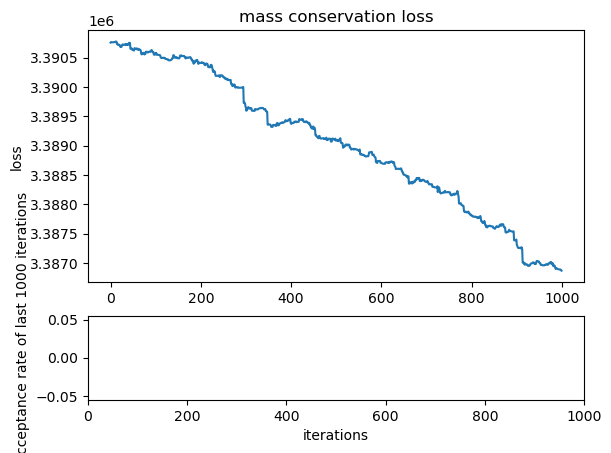

In [98]:
fig = geomc.plot_loss(np.array([loss_mc_cache]), np.array([step_cache]))

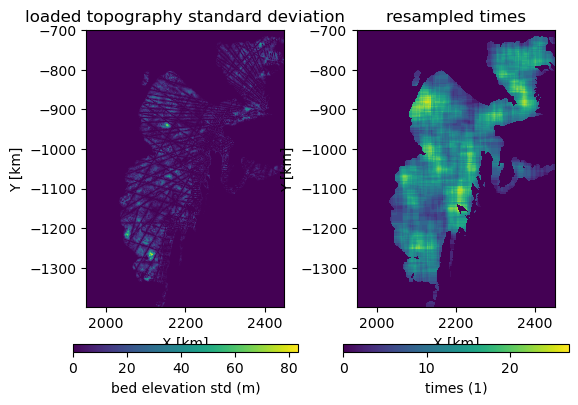

In [104]:
fig = geomc.plot_sample(bed_cache, np.array([resampled_times]), xx, yy)

(1950250.0, 2450250.0, -1399750.0, -699750.0)

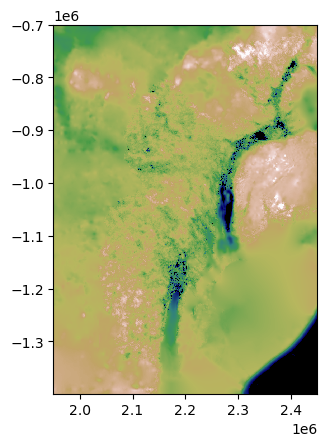

In [99]:
plt.pcolormesh(xx,yy,bed_cache[0],vmax=500,vmin=-2500,cmap='gist_earth')
plt.axis('scaled')

(1950250.0, 2450250.0, -1399750.0, -699750.0)

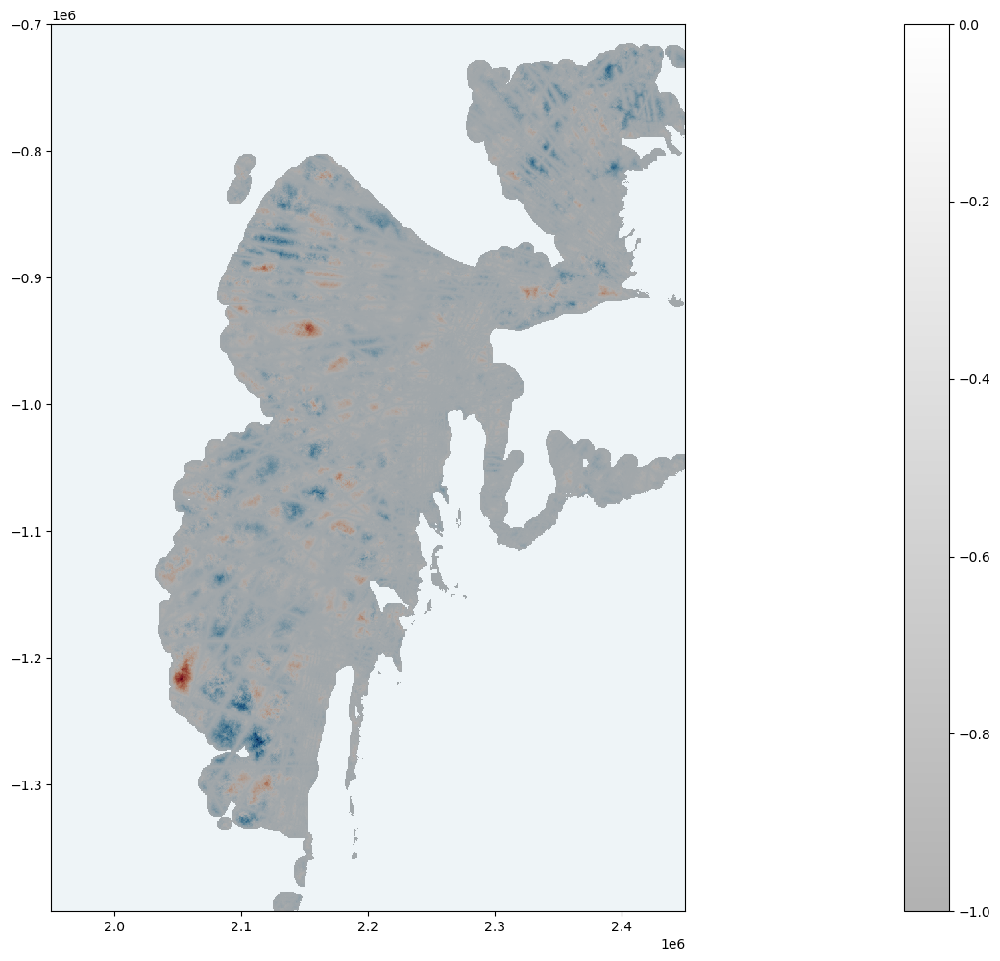

In [102]:
plt.figure(figsize=(16,12))
plt.pcolormesh(xx,yy,bed_cache[-1]-bed_cache[1],cmap='RdBu')
plt.pcolormesh(xx,yy,-1*df['mask'].values.reshape(xx.shape),cmap='grey',alpha=0.3)
plt.colorbar()
plt.axis('scaled')

In [11]:
os.getcwd()

'/home/niyashao/3MC/embed_BM'

In [12]:
df = pd.read_csv('../beforeJuly26/compiled_Denman_QC_iceshelve_included_34_1_shallow.csv')
cols = len(np.unique(df['X']))
rows = len(np.unique(df['Y']))

In [13]:
# parameters for plotting and global information
res = 500

cols = len(np.unique(df['X']))
rows = len(np.unique(df['Y']))

x_uniq = np.unique(df.X)
y_uniq = np.unique(df.Y)

xx, yy = np.meshgrid(x_uniq, y_uniq)
xx.shape

(200, 300)

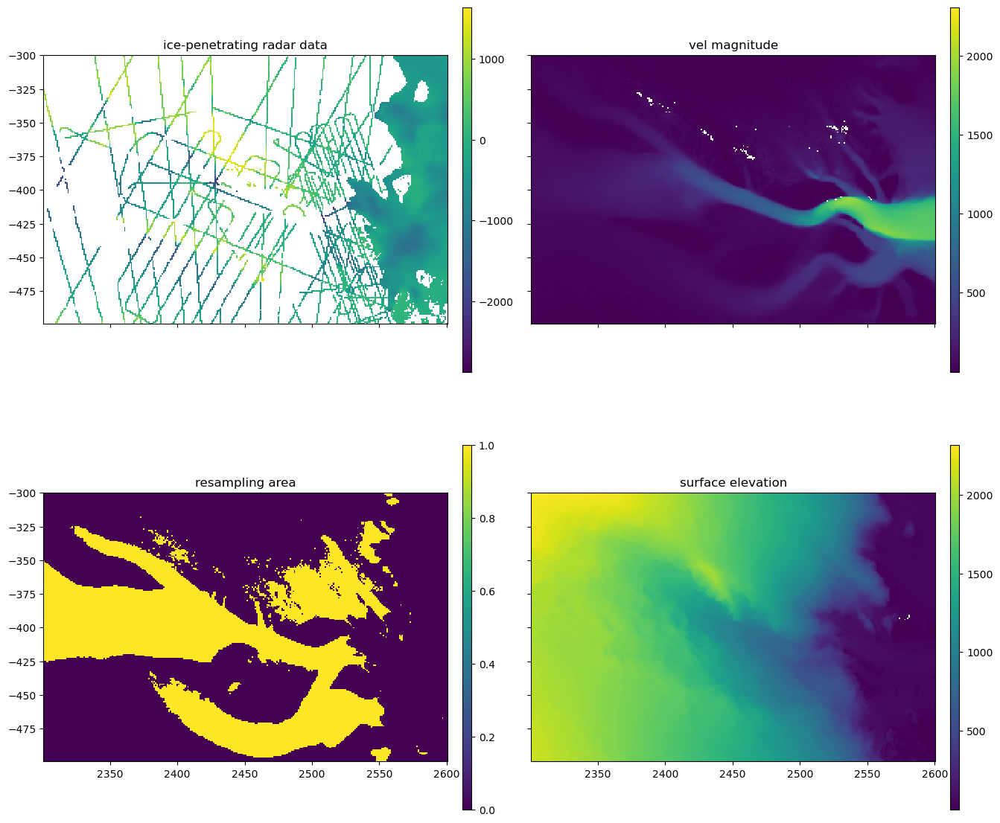

In [14]:
ds = [df.bed, np.sqrt(df.vel_x**2+df.vel_y**2), df['mask'], df.surface]
titles = ['ice-penetrating radar data', 'vel magnitude', 'resampling area', 'surface elevation']

fig, axs = plt.subplots(2, 2, figsize=(17,14), sharey=True, sharex=True,
                       gridspec_kw={'wspace':-0.01})

for ax, d, t in zip(axs.ravel(), ds, titles):
    im = ax.pcolormesh(xx/1000, yy/1000, d.values.reshape(xx.shape))
    ax.set_title(t)
    ax.axis('scaled')
    plt.colorbar(im, ax=ax, pad=0.03, aspect=40)
plt.show()

In [15]:
cond_msk = ~np.isnan(df.bed.values.reshape(xx.shape))
cond_mask_2 = df['mask'].values.reshape(xx.shape)==0
cond_msk = cond_mask_2 | cond_msk

In [64]:
def min_dist(hard_mat, xx, yy, xy_list):
    dist = np.zeros(xy_list.shape[0])
    xx_hard = np.where(np.isnan(hard_mat), np.nan, xx)
    yy_hard = np.where(np.isnan(hard_mat), np.nan, yy)
    
    for i in range(xy_list.shape[0]):
        #for j in range(xx.shape[1]):
        dist[i] = np.nanmin(np.sqrt(np.square(xy_list[i,1]-yy_hard)+np.square(xy_list[i,0]-xx_hard)))

        if i%100000 == 0:
            print('get', i, 'values done')
    
    return dist

In [65]:
dfxy = df.copy()
dfxy = dfxy[(dfxy.bed.isnull())&(dfxy['mask'].values == 1)]

In [66]:
xy_list = np.array([dfxy.X.values.flatten(),dfxy.Y.values.flatten()]).T

In [45]:
now = time.time()
dist = min_dist(np.where(cond_msk==0, np.nan, 1), xx, yy, xy_list)
print('used ', time.time()-now, ' seconds')

used  8.803438425064087  seconds


In [60]:
now = time.time()
dist = min_dist(np.where(cond_msk==0, np.nan, 1), xx, yy, xy_list)
print('used ', time.time()-now, ' seconds')

used  3.1563796997070312  seconds


In [67]:
now = time.time()
dist = min_dist(np.where(cond_msk==0, np.nan, 1), xx, yy, xy_list)
print('used ', time.time()-now, ' seconds')

get 0 values done
used  3.2108640670776367  seconds


In [68]:
xy_list.shape

(15749, 2)

In [61]:
df['dist'] = 0.0

In [62]:
df.loc[dfxy.index, 'dist'] = dist

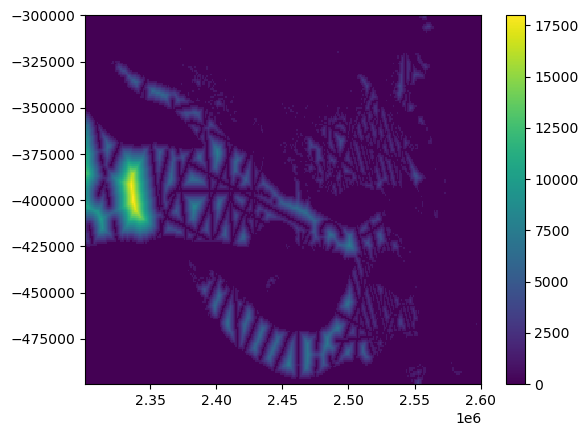

In [50]:
plt.pcolormesh(xx,yy,df.dist.values.reshape(xx.shape))
plt.colorbar()

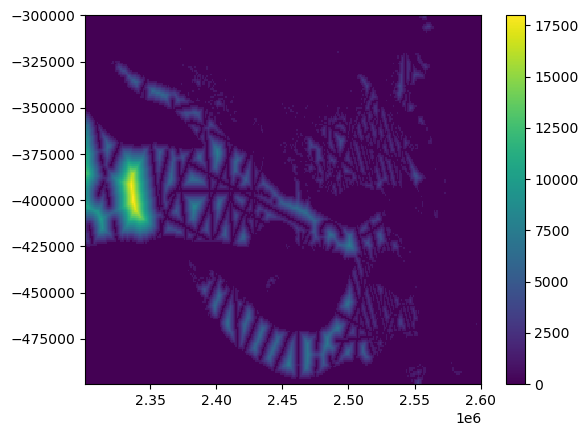

In [63]:
plt.pcolormesh(xx,yy,df.dist.values.reshape(xx.shape))
plt.colorbar()